# Synthetic experiment: XPAL with SimCLR Two Moons

## Setup

In [1]:
import logging

import lightning as L
import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib.lines import Line2D
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch import nn
from torch.nn.functional import softmax
from torch.optim import SGD, Adam
from torch.utils.data import Dataset, DataLoader

from dal_toolbox import metrics
from dal_toolbox.active_learning import ActiveLearningDataModule
from dal_toolbox.active_learning.strategies import xpal, xpalclust
from dal_toolbox.active_learning.strategies.xpal import xpal_gain
from dal_toolbox.datasets.utils import RepeatTransformations
from dal_toolbox.models.deterministic import simclr, DeterministicModel
from dal_toolbox.models.deterministic.linear import LinearModel
from dal_toolbox.models.deterministic.simclr import InfoNCELoss
from dal_toolbox.models.parzen_window_classifier import PWCLightning
from dal_toolbox.models.utils.lr_scheduler import CosineAnnealingLRLinearWarmup
from dal_toolbox.utils import _calculate_mean_gamma, kernels, seed_everything

# configure logging at the root level of Lightning
logging.getLogger("lightning.pytorch").setLevel(logging.ERROR)
print("Setup complete")

Setup complete


## Helper classes/functions

In [2]:
class GaussianNoiseTransform:
    def __init__(self, mean=0.0, std=1.0, random_seed=0):
        self.rng = np.random.default_rng(random_seed)
        self.mean = mean
        self.std = std

    def __call__(self, x):
        return x + torch.tensor(self.rng.normal(self.mean, self.std, size=x.shape), dtype=torch.float32)


class SKLearnDataset(Dataset):
    def __init__(self, X, y, transforms=None):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y)
        self.transforms = transforms

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, idx):
        x = self.X[idx]
        if self.transforms is not None:
            x = self.transforms(x)

        return x, self.y[idx]

In [3]:
@torch.inference_mode()
def get_representations_and_labels(model, dataloader):
    all_features = []
    all_labels = []
    for batch in dataloader:
        features = batch[0]
        labels = batch[1]
        all_features.append(model(features))
        all_labels.append(labels)
    features = torch.cat(all_features)
    labels = torch.cat(all_labels)
    return features, labels

@torch.inference_mode()
def get_representations(model, dataloader):
    all_features = []
    for batch in dataloader:
        features = batch[0]
        all_features.append(model(features))
    features = torch.cat(all_features)
    return features

In [4]:
def generate_grid(x_dim, y_dim, grid_size, model, standardize):
    xx, yy = np.meshgrid(np.linspace(x_dim[0], x_dim[1], grid_size), np.linspace(y_dim[0], y_dim[1], grid_size))
    x_in = np.c_[xx.ravel(), yy.ravel()]

    grid_dataset = SKLearnDataset(x_in, np.zeros(x_in.shape[0]))
    grid_dataloader = DataLoader(grid_dataset, batch_size=512, shuffle=False)
    grid_features = get_representations(model, grid_dataloader)
    if standardize:
        grid_features = torch.from_numpy(scaler.transform(grid_features)).to(dtype=torch.float32)
    return grid_features, xx, yy


def calculate_gain_from_strategy(strategy, labeled_indices, unlabeled_indices, num_classes, alpha):
    S = strategy.S
    return calculate_gain(S, labeled_indices, unlabeled_indices, num_classes, alpha)


def calculate_gain_from_data(data, labeled_indices, unlabeled_indices, num_classes, alpha, gamma):
    S = kernels(data, data, metric="rbf", gamma=gamma)
    return calculate_gain(S, labeled_indices, unlabeled_indices, num_classes, alpha)


def calculate_gain(S, labeled_indices, unlabeled_indices, num_classes, alpha):
    Z = np.eye(num_classes)[y_labeled]
    K_x = S[:, labeled_indices] @ Z
    K_c = K_x[unlabeled_indices]
    return xpal_gain(K_c=K_c, K_x=K_x, S=S[unlabeled_indices], alpha_c=alpha, alpha_x=alpha)


def get_data(datamodule):
    labeled_loader, labeled_indices = datamodule.labeled_dataloader()
    y_labeled = []
    labeled_samples = []
    for batch in labeled_loader:
        y_labeled.append(batch[1])
        labeled_samples.append(batch[0])
    if len(y_labeled) > 0:
        y_labeled = torch.cat(y_labeled).tolist()
        labeled_samples = torch.cat(labeled_samples)
    labeled_samples = torch.tensor(labeled_samples)
    unlabeled_loader, unlabeled_indices = datamodule.unlabeled_dataloader()
    unlabeled_samples = []
    for batch in unlabeled_loader:
        unlabeled_samples.append(batch[0])
    unlabeled_samples = torch.cat(unlabeled_samples)

    return labeled_samples, labeled_indices, y_labeled, unlabeled_samples, unlabeled_indices


def calc_accuracy(trainer, model, dataloader):
    predictions = trainer.predict(model, dataloader)
    logits = torch.cat([pred[0] for pred in predictions])
    targets = torch.cat([pred[1] for pred in predictions])
    return metrics.Accuracy()(logits, targets).item()

## Settings

In [13]:
num_classes = 2
seed = 0
moon_noise = 0.05
transforms_noise = moon_noise / 5

# Model parameters
feature_model_type = "simclr"

# SimCLR
if feature_model_type == "simclr":
    temperature = 0.5
    encoder_output_dim=128

    train_batch_size = 256
    learning_rate = 0.005
    weight_decay = 0.00001
    n_epochs = 100

    encoder = nn.Sequential(nn.Linear(num_classes, 16), nn.ReLU(), nn.Linear(16, 32), nn.ReLU(), nn.Linear(32, 64), nn.ReLU(), nn.Linear(64, encoder_output_dim), nn.ReLU(),)
    projector = nn.Sequential(nn.Linear(encoder_output_dim, 64))

#MLP
elif feature_model_type == "mlp":
    train_batch_size = 64
    learning_rate = 0.01
    weight_decay = 0.0005
    n_epochs = 35
    encoder_output_dim=32

    feature_model_encoder = nn.Sequential(nn.Linear(num_classes, 16), nn.ReLU(), nn.Linear(16, encoder_output_dim), nn.ReLU())
    projector = nn.Linear(encoder_output_dim, 2)
    mlp = nn.Sequential(feature_model_encoder, projector)
else:
    raise NotImplementedError("Model not implemented")

# Strategy
alpha = 1e-9
standardize = False

# Plotting
x_min, x_max = -1.5, 2.5
y_min, y_max = -1.0, 1.5
grid_size = 150

seed_everything(seed)

Global seed set to 0


## Data

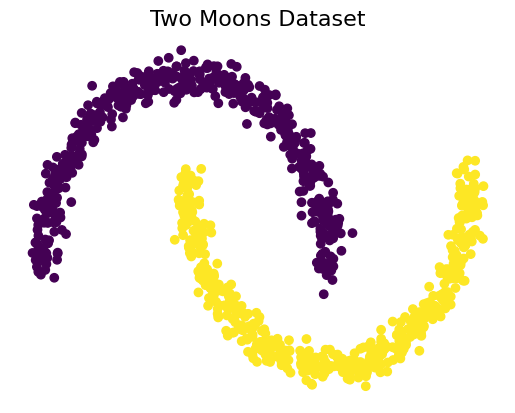

In [6]:
X, y = make_moons(1000, random_state=seed, noise=moon_noise)
# X, y = make_circles(1000, random_state=seed, noise=moon_noise, factor=0.5)

plt.scatter(X[:, 0], X[:, 1], c=y, marker="o")
plt.title("Two Moons Dataset", size=16)
plt.axis('off')
plt.savefig("two_moons.pdf", bbox_inches='tight')
plt.show()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=seed, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=seed, stratify=y_train)

## SimCLR

In [14]:
if feature_model_type == "simclr":
    transform = RepeatTransformations(GaussianNoiseTransform(std=transforms_noise, random_seed=seed))

    trainset = SKLearnDataset(X_train, y_train, transform)
    valset = SKLearnDataset(X_val, y_val, transform)
    testset = SKLearnDataset(X_test, y_test)

    train_dataloader = DataLoader(trainset, batch_size=train_batch_size, shuffle=True)
    val_dataloader = DataLoader(valset, batch_size=train_batch_size, shuffle=False)
    test_dataloader = DataLoader(testset, batch_size=train_batch_size, shuffle=False)

    optimizer = SGD(params=list(encoder.parameters()) + list(projector.parameters()),
                lr=learning_rate,
                weight_decay=weight_decay)

    lr_scheduler = CosineAnnealingLRLinearWarmup(
        optimizer=optimizer,
        num_epochs=n_epochs,
        warmup_epochs=10
    )

    feature_model = simclr.SimCLR(
        encoder=encoder,
        projector=projector,
        loss_fn=InfoNCELoss(temperature),
        optimizer=optimizer,
        lr_scheduler=lr_scheduler,
        train_metrics={'train_acc_top1': metrics.ContrastiveAccuracy(),
                       'train_acc_top5': metrics.ContrastiveAccuracy(topk=5)},
        val_metrics={'val_acc_top1': metrics.ContrastiveAccuracy(),
                     'val_acc_top5': metrics.ContrastiveAccuracy(topk=5)}
    )
    feature_model.encoder_output_dim = encoder_output_dim
elif feature_model_type == "mlp":
    trainset = SKLearnDataset(X_train, y_train)
    valset = SKLearnDataset(X_val, y_val)
    testset = SKLearnDataset(X_test, y_test)

    train_dataloader = DataLoader(trainset, batch_size=train_batch_size, shuffle=True)
    val_dataloader = DataLoader(valset, batch_size=train_batch_size, shuffle=False)
    test_dataloader = DataLoader(testset, batch_size=train_batch_size, shuffle=False)

    optimizer = Adam(params=mlp.parameters(),
                    lr=learning_rate,
                weight_decay=weight_decay)

    lr_scheduler = CosineAnnealingLRLinearWarmup(
        optimizer=optimizer,
        num_epochs=n_epochs,
        warmup_epochs=10
    )

    feature_model = DeterministicModel(
        mlp, optimizer=optimizer, lr_scheduler=lr_scheduler,
        train_metrics={'train_acc': metrics.Accuracy()},
        val_metrics={'val_acc': metrics.Accuracy()},
    )
    feature_model.encoder = feature_model_encoder
else:
    raise NotImplementedError("")

trainer = L.Trainer(
    default_root_dir="SIMCLR_Two_Moons",
    accelerator="auto",
    max_epochs=n_epochs,
    check_val_every_n_epoch=4,
    enable_progress_bar=True,
    deterministic=True
)

In [15]:
trainer.fit(feature_model, train_dataloader, val_dataloader)

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

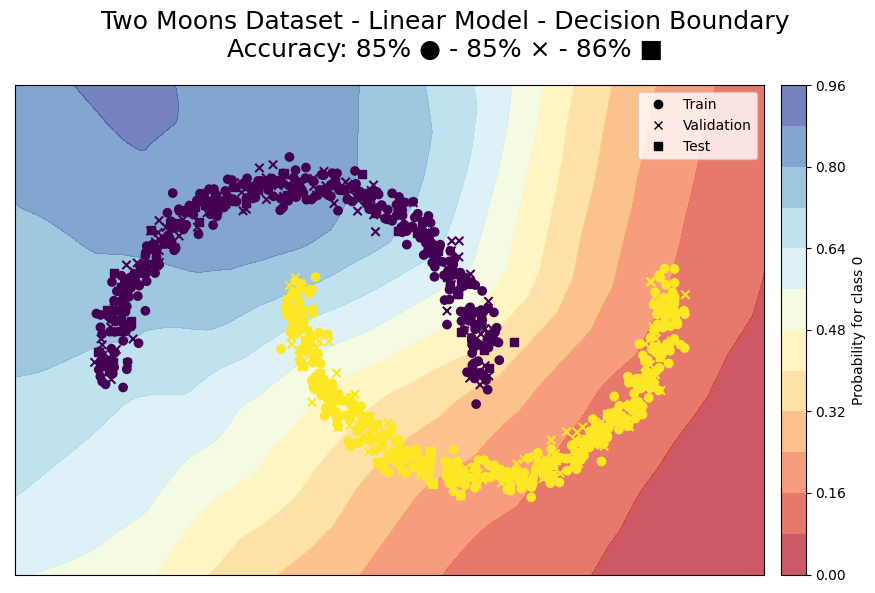

In [16]:
if feature_model_type == "mlp":
    # Deciscion Boundary
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, grid_size), np.linspace(y_min, y_max, grid_size))
    x_in = np.c_[xx.ravel(), yy.ravel()]


    grid_dataset = SKLearnDataset(x_in, np.zeros(x_in.shape[0]))
    grid_dataloader = DataLoader(grid_dataset, batch_size=512, shuffle=False)
    y_pred = trainer.predict(feature_model, grid_dataloader)
    y_pred = nn.functional.softmax(torch.cat([pred[0] for pred in y_pred]))
    y_pred = y_pred[:, 0].numpy().reshape(xx.shape)

    train_accuracy = calc_accuracy(trainer, feature_model, train_dataloader)
    val_accuracy = calc_accuracy(trainer, feature_model, val_dataloader)
    test_accuracy = calc_accuracy(trainer, feature_model, test_dataloader)

    fig, ax = plt.subplots(ncols=1, sharex=True, sharey=True, figsize=(7, 6))

    contour = ax.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7)
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())

    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="s")
    ax.set_title(f"")

    train_marker = Line2D([0], [0], marker='o', color='black', label='Train', markerfacecolor='black', linewidth=0)
    val_marker = Line2D([0], [0], marker='x', color='black', label='Validation', markerfacecolor='black', linewidth=0)
    test_marker =  Line2D([0], [0], marker='s', color='black', label='Test', markerfacecolor='black', linewidth=0)
    legend_elements = [train_marker,val_marker, test_marker]
    ax.legend(handles=legend_elements)

    fig.suptitle(f"Two Moons Dataset - Linear Model - Decision Boundary\nAccuracy: {train_accuracy:.0%} ● - {val_accuracy:.0%} × - {test_accuracy:.0%} ■")
    fig.colorbar(contour, ax=ax)
    plt.savefig("two_moons_linear_simclr.pdf")
    plt.show()
elif feature_model_type == "simclr":
    trainset = SKLearnDataset(X_train, y_train)
    valset = SKLearnDataset(X_val, y_val)
    testset = SKLearnDataset(X_test, y_test)

    train_dataloader = DataLoader(trainset, batch_size=512, shuffle=False)
    val_dataloader = DataLoader(valset, batch_size=512, shuffle=False)
    test_dataloader = DataLoader(testset, batch_size=512, shuffle=False)

    train_features, train_labels = get_representations_and_labels(feature_model.encoder, train_dataloader)
    val_features, val_labels = get_representations_and_labels(feature_model.encoder, val_dataloader)
    test_features, test_labels = get_representations_and_labels(feature_model.encoder, test_dataloader)

    if standardize:
        scaler = StandardScaler().fit(train_features)
        train_features = torch.from_numpy(scaler.transform(train_features)).to(dtype=torch.float32)
        val_features = torch.from_numpy(scaler.transform(val_features)).to(dtype=torch.float32)
        test_features = torch.from_numpy(scaler.transform(test_features)).to(dtype=torch.float32)
    grid_features, xx, yy = generate_grid(x_dim=(x_min, x_max), y_dim=(y_min, y_max), grid_size=grid_size, model=feature_model.encoder, standardize=standardize)

    trainset = SKLearnDataset(train_features, train_labels)
    valset = SKLearnDataset(val_features, val_labels)
    testset = SKLearnDataset(test_features, test_labels)

    feature_train_dataloader = DataLoader(trainset, batch_size=64, shuffle=False)
    feature_val_dataloader = DataLoader(valset, batch_size=512, shuffle=False)
    feature_test_dataloader = DataLoader(testset, batch_size=512, shuffle=False)

    lin_model = LogisticRegression(random_state=seed)
    lin_model.fit(train_features, train_labels)

    # Deciscion Boundary
    y_pred = lin_model.predict_proba(grid_features)
    y_pred = y_pred[:, 0].reshape(xx.shape)

    train_accuracy = accuracy_score(y_train, lin_model.predict(train_features))
    val_accuracy = accuracy_score(y_val, lin_model.predict(val_features))
    test_accuracy = accuracy_score(y_test, lin_model.predict(test_features))

    fig, ax = plt.subplots(ncols=1, sharex=True, sharey=True, figsize=(9, 6))

    contour = ax.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())

    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="s")
    ax.set_title(f"")

    ax.set_xticks([])
    ax.set_yticks([])

    train_marker = Line2D([0], [0], marker='o', color='black', label='Train', markerfacecolor='black', linewidth=0)
    val_marker = Line2D([0], [0], marker='x', color='black', label='Validation', markerfacecolor='black', linewidth=0)
    test_marker =  Line2D([0], [0], marker='s', color='black', label='Test', markerfacecolor='black', linewidth=0)
    legend_elements = [train_marker,val_marker, test_marker]
    ax.legend(handles=legend_elements)

    fig.suptitle(f"Two Moons Dataset - Linear Model - Decision Boundary\nAccuracy: {train_accuracy:.0%} ● - {val_accuracy:.0%} × - {test_accuracy:.0%} ■", fontsize=18)
    fig.colorbar(contour, ax=ax, label="Probability for class 0", fraction=0.1, pad=0.02, spacing='proportional')
    fig.tight_layout()
    plt.savefig("two_moons_linear_simclr.pdf", bbox_inches='tight')
    plt.show()

## Linear model

In [9]:
# Get representations while ensuring ability to get representation back
trainset = SKLearnDataset(X_train, y_train)
valset = SKLearnDataset(X_val, y_val)
testset = SKLearnDataset(X_test, y_test)

train_dataloader = DataLoader(trainset, batch_size=512, shuffle=False)
val_dataloader = DataLoader(valset, batch_size=512, shuffle=False)
test_dataloader = DataLoader(testset, batch_size=512, shuffle=False)

train_features, train_labels = get_representations_and_labels(feature_model.encoder, train_dataloader)
val_features, val_labels = get_representations_and_labels(feature_model.encoder, val_dataloader)
test_features, test_labels = get_representations_and_labels(feature_model.encoder, test_dataloader)

if standardize:
    scaler = StandardScaler().fit(train_features)
    train_features = torch.from_numpy(scaler.transform(train_features)).to(dtype=torch.float32)
    val_features = torch.from_numpy(scaler.transform(val_features)).to(dtype=torch.float32)
    test_features = torch.from_numpy(scaler.transform(test_features)).to(dtype=torch.float32)

final = True
if final:
    torch.save(train_features, "train_features_final_simclr.pth")
    torch.save(train_labels, "train_labels_final_simclr.pth")
    torch.save(val_features, "val_features_final_simclr.pth")
    torch.save(val_labels, "val_labels_final_simclr.pth")
    torch.save(test_features, "test_features_final_simclr.pth")
    torch.save(test_labels, "test_labels_final_simclr.pth")
    torch.save(feature_model, "feature_model.pth")

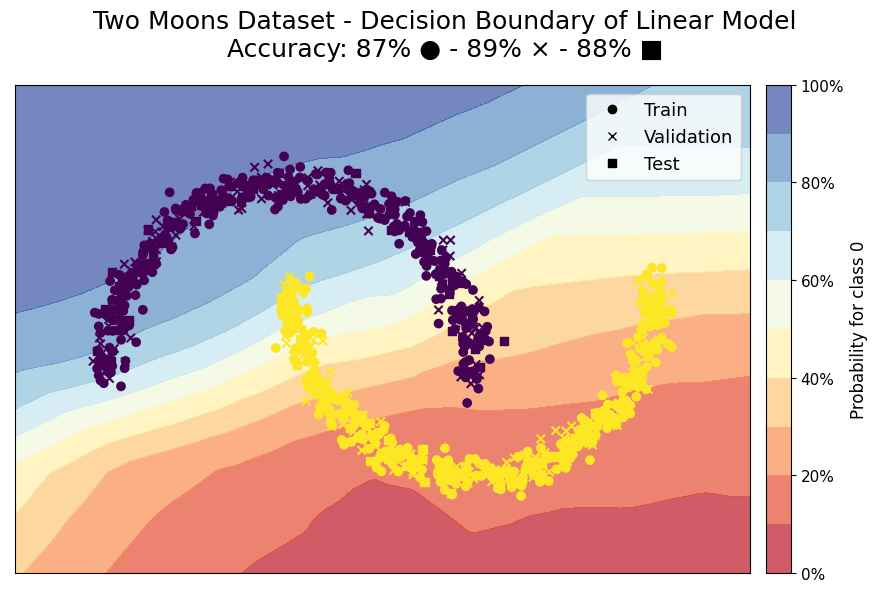

In [10]:
train_features = torch.load("train_features_final_simclr.pth")
train_labels = torch.load("train_labels_final_simclr.pth")
val_features = torch.load("val_features_final_simclr.pth")
val_labels = torch.load("val_labels_final_simclr.pth")
test_features = torch.load( "test_features_final_simclr.pth")
test_labels = torch.load("test_labels_final_simclr.pth")
feature_model = torch.load("feature_model.pth")

grid_features, xx, yy = generate_grid(x_dim=(x_min, x_max), y_dim=(y_min, y_max), grid_size=grid_size, model=feature_model.encoder, standardize=standardize)

trainset = SKLearnDataset(train_features, train_labels)
valset = SKLearnDataset(val_features, val_labels)
testset = SKLearnDataset(test_features, test_labels)

feature_train_dataloader = DataLoader(trainset, batch_size=64, shuffle=False)
feature_val_dataloader = DataLoader(valset, batch_size=512, shuffle=False)
feature_test_dataloader = DataLoader(testset, batch_size=512, shuffle=False)

lin_model = LogisticRegression(random_state=seed)
lin_model.fit(train_features, train_labels)

base_model = LinearModel(encoder_output_dim, num_classes)
optimizer = Adam(params=base_model.parameters(),
                    lr=0.01,
                weight_decay=0.0005)

lr_scheduler = CosineAnnealingLRLinearWarmup(
    optimizer=optimizer,
    num_epochs=40,
    warmup_epochs=10
)

lin_model = DeterministicModel(
    base_model, optimizer=optimizer, lr_scheduler=lr_scheduler,
    train_metrics={'train_acc': metrics.Accuracy()},
    val_metrics={'val_acc': metrics.Accuracy()},
)

trainer = L.Trainer(
        max_epochs=40,
        enable_checkpointing=False,
        accelerator="cpu",
        default_root_dir="Lieanr_Base_Two_Moons",
        enable_progress_bar=False,
        check_val_every_n_epoch=1,
    )
trainer.fit(model=lin_model, train_dataloaders=feature_train_dataloader, val_dataloaders=feature_val_dataloader)
# Deciscion Boundary
#y_pred = lin_model.predict_proba(grid_features)

with torch.no_grad():
    y_pred = softmax(lin_model.model(grid_features))
y_pred = y_pred[:, 0].reshape(xx.shape)

#train_accuracy = accuracy_score(y_train, lin_model.predict(train_features))
#val_accuracy = accuracy_score(y_val, lin_model.predict(val_features))
#test_accuracy = accuracy_score(y_test, lin_model.predict(test_features))

train_accuracy = calc_accuracy(trainer, lin_model, feature_train_dataloader)
val_accuracy = calc_accuracy(trainer, lin_model, feature_val_dataloader)
test_accuracy = calc_accuracy(trainer, lin_model, feature_test_dataloader)

fig, ax = plt.subplots(ncols=1, sharex=True, sharey=True, figsize=(9, 6))

contour = ax.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
ax.set_xlim(xx.min(), xx.max())
ax.set_ylim(yy.min(), yy.max())

ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
ax.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="s")
ax.set_title(f"")

ax.set_xticks([])
ax.set_yticks([])

train_marker = Line2D([0], [0], marker='o', color='black', label='Train', markerfacecolor='black', linewidth=0)
val_marker = Line2D([0], [0], marker='x', color='black', label='Validation', markerfacecolor='black', linewidth=0)
test_marker =  Line2D([0], [0], marker='s', color='black', label='Test', markerfacecolor='black', linewidth=0)
legend_elements = [train_marker,val_marker, test_marker]
ax.legend(handles=legend_elements, fontsize=13)

fig.suptitle(f"Two Moons Dataset - Decision Boundary of Linear Model\nAccuracy: {train_accuracy:.0%} ● - {val_accuracy:.0%} × - {test_accuracy:.0%} ■", fontsize=18)
fmt = lambda x, pos: "{:g}%".format(x * 100)
cb = fig.colorbar(contour, ax=ax, fraction=0.1, pad=0.02, format=fmt)
cb.set_label(label='Probability for class 0', fontsize=12)
cb.ax.tick_params(labelsize=11)
fig.tight_layout()
plt.savefig("two_moons_linear_simclr.pdf", bbox_inches='tight')
plt.show()

In [12]:
# This does not work correctly for some reason

# lin_model = LinearModel(encoder_output_dim, num_classes=num_classes)
# optimizer = torch.optim.SGD(model.parameters(), lr=0.01, weight_decay=0.005)
#
# trainer = L.Trainer(
#             default_root_dir="SIMCLR_Two_Moons_linear",
#             max_epochs=20,
#             enable_checkpointing=False,
#             accelerator="auto",
#             enable_progress_bar=True,
#             check_val_every_n_epoch=4,
#         )
#
# lin_model = DeterministicModel(
#         lin_model, optimizer=optimizer, lr_scheduler=None,
#         train_metrics={'train_acc': metrics.Accuracy()},
#         val_metrics={'val_acc': metrics.Accuracy()},
#     )
# trainer.fit(lin_model, feature_train_dataloader, feature_val_dataloader)
# predictions = trainer.predict(lin_model, feature_test_dataloader)
# logits = torch.cat([pred[0] for pred in predictions])
# targets = torch.cat([pred[1] for pred in predictions])
# print(f"Test Accuracy = {metrics.Accuracy()(logits, targets).item():.4f}")
#
# # Deciscion Boundary
# x_min, x_max = -1.5, 2.5
# y_min, y_max = -1.0, 1.5
# xx, yy = np.meshgrid(np.linspace(x_min, x_max, grid_size), np.linspace(y_min, y_max, grid_size))
# x_in = np.c_[xx.ravel(), yy.ravel()]
#
# grid_dataset = SKLearnDataset(x_in, np.zeros(x_in.shape[0]))
# grid_dataloader = DataLoader(grid_dataset, batch_size=512, shuffle=False)
# grid_features = get_representations(model.encoder, grid_dataloader)
# if standardize:
#     grid_features = torch.from_numpy(scaler.transform(grid_features)).to(dtype=torch.float32)
#
# grid_dataloader = DataLoader(SKLearnDataset(grid_features, np.zeros(x_in.shape[0])), batch_size=512, shuffle=False)
# predictions = trainer.predict(lin_model, grid_dataloader)
# y_pred = torch.cat([pred[0] for pred in predictions])
# y_pred = torch.nn.functional.softmax(y_pred)
# y_pred = y_pred[:, 0].reshape(xx.shape)
#
#
# fig, ax = plt.subplots(ncols=1, sharex=True, sharey=True, figsize=(7, 6))
#
# contour = ax.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7)
# ax.set_xlim(xx.min(), xx.max())
# ax.set_ylim(yy.min(), yy.max())
#
# ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
# ax.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
# ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="X", alpha=0.5)
# ax.set_title(f"")
# fig.colorbar(contour, ax=ax)

## XPAL

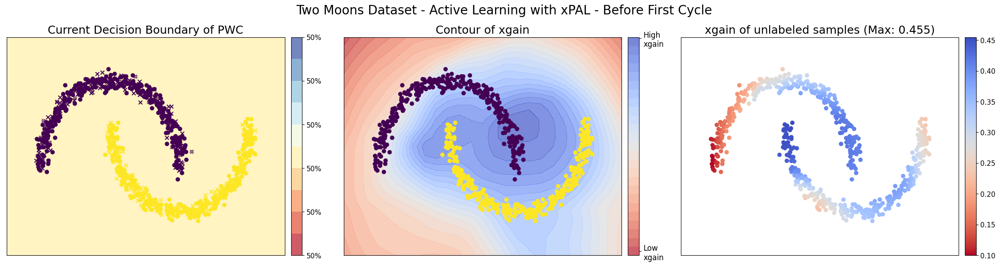

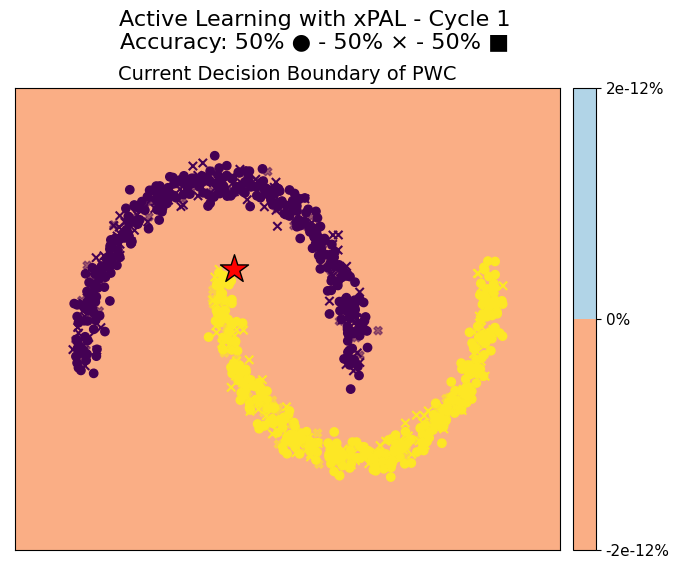

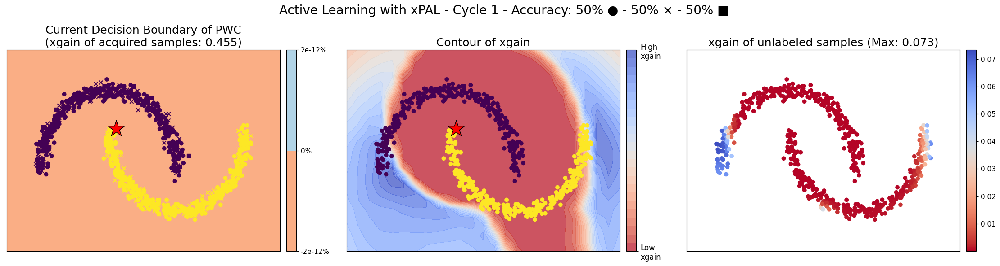

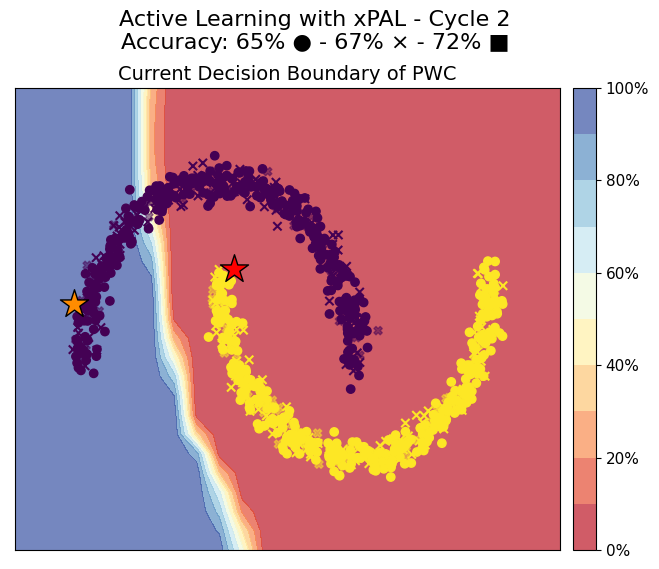

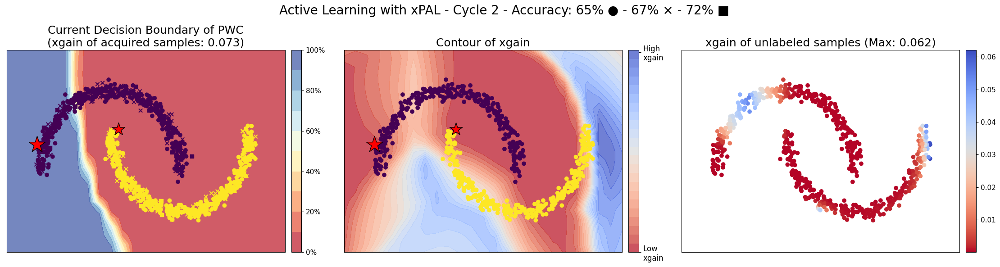

...

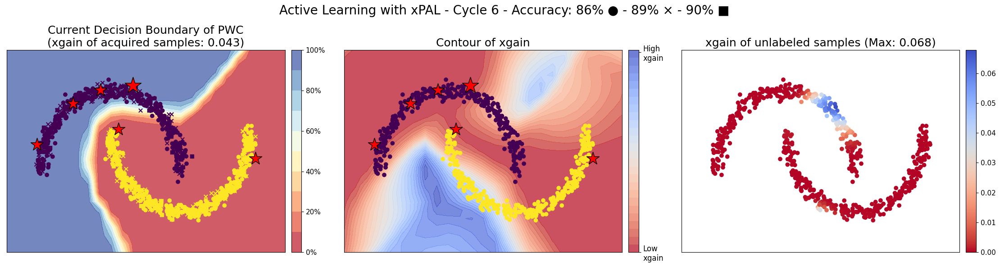

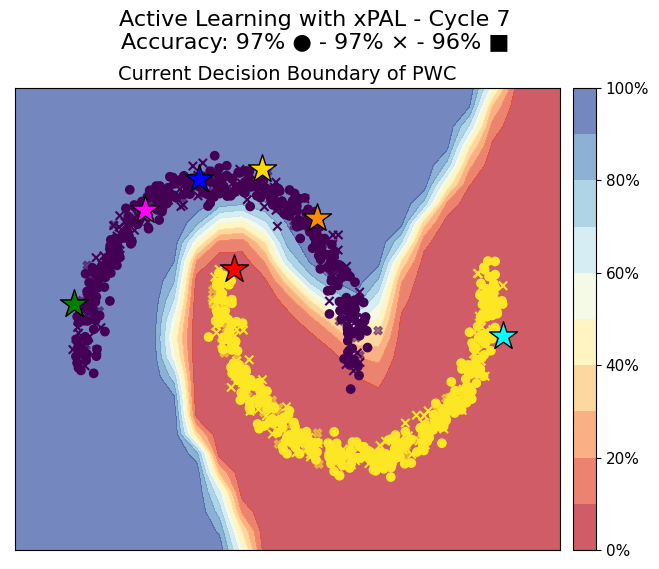

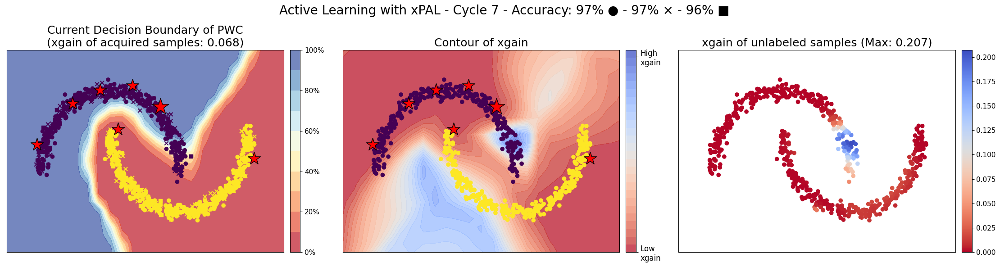

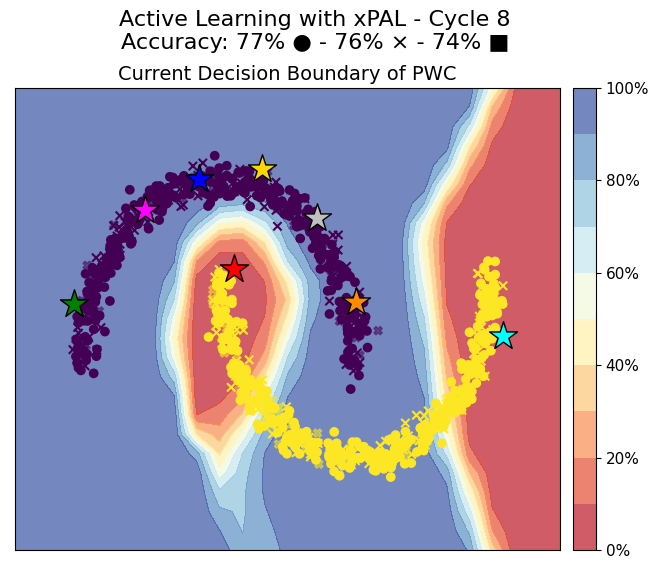

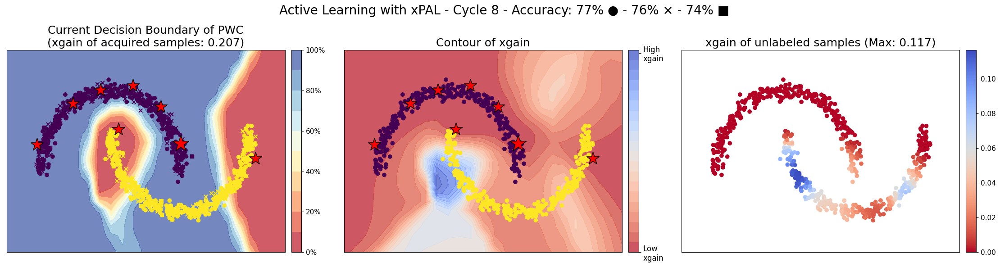

In [12]:
grid_size=25

# # Since I cant get it to be deterministic, I load the features every time
train_features = torch.load("train_features_final_simclr.pth")
train_labels = torch.load("train_labels_final_simclr.pth")
val_features = torch.load("val_features_final_simclr.pth")
val_labels = torch.load("val_labels_final_simclr.pth")
test_features = torch.load( "test_features_final_simclr.pth")
test_labels = torch.load("test_labels_final_simclr.pth")
feature_model = torch.load("feature_model.pth")

grid_features, xx, yy = generate_grid(x_dim=(x_min, x_max), y_dim=(y_min, y_max), grid_size=grid_size, model=feature_model.encoder, standardize=standardize)

trainset = SKLearnDataset(train_features, train_labels)
valset = SKLearnDataset(val_features, val_labels)
testset = SKLearnDataset(test_features, test_labels)

feature_train_dataloader = DataLoader(trainset, batch_size=64, shuffle=False)
feature_val_dataloader = DataLoader(valset, batch_size=512, shuffle=False)
feature_test_dataloader = DataLoader(testset, batch_size=512, shuffle=False)

results = {}
queried_indices = {}

# AL Strategy
gamma = _calculate_mean_gamma(train_features)
S = kernels(X=train_features, Y=train_features, metric="rbf", gamma=gamma)
strategy = "xpal"
# Active learning
xpal_init = True
n_init = 0
n_query = 1
n_cylce = 8

if strategy == "xpal":
    al_strategy = xpal.XPAL(num_classes, S, subset_size=None, alpha_c=alpha, alpha_x=alpha, random_seed=seed)
    name = "xPAL"
elif strategy == "xpalclust":
    al_strategy = xpalclust.XPALClust(num_classes, S, subset_size=None, alpha_c=alpha, alpha_x=alpha, random_seed=seed)
    name = "xPALClust"

# AL Model
kernel_params = {"kernel": {"name": "rbf", "gamma": gamma}, "n_neighbors": None}
al_model = PWCLightning(n_classes=num_classes,
                        random_state=seed,
                        kernel_params=kernel_params,
                        train_metrics={'train_acc': metrics.Accuracy()},
                        val_metrics={'val_acc': metrics.Accuracy()})

# Setup AL Module
al_datamodule = ActiveLearningDataModule(
    train_dataset=trainset,
    val_dataset=valset,
    test_dataset=testset,
    train_batch_size=train_batch_size,
    predict_batch_size=512,
    seed=seed
)

labeled_samples, labeled_indices, y_labeled, unlabeled_samples, unlabeled_indices = get_data(al_datamodule)

unlabeled_gains = calculate_gain_from_strategy(al_strategy, labeled_indices, unlabeled_indices, num_classes, alpha)

y_pred = al_model.model.predict_proba(grid_features)
y_pred = y_pred[:, 0].reshape(xx.shape)

data = torch.cat([labeled_samples, grid_features])

mapped_labeled_indices = np.arange(0, len(labeled_samples))
mapped_unlabeled_indices = np.arange(len(labeled_samples), len(labeled_samples) + grid_features.shape[0])

grid_gains = calculate_gain_from_data(data, mapped_labeled_indices, mapped_unlabeled_indices, num_classes, alpha, gamma)
grid_gains = grid_gains.reshape(xx.shape)

indices, top_gains = al_strategy.query(
        model=al_model,
        al_datamodule=al_datamodule,
        acq_size=n_query,
        return_gains=True
    )

max_gain_x_idx , max_gain_y_idx = np.unravel_index(np.argmax(grid_gains), grid_gains.shape)
max_gain_x , max_gain_y = xx[max_gain_x_idx, max_gain_y_idx], yy[max_gain_x_idx, max_gain_y_idx]

fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(22.5, 6))
fig.suptitle(f"Two Moons Dataset - Active Learning with {name} - Before First Cycle", fontsize=20)

ax1, ax2, ax3 = axes[0], axes[1], axes[2]

contour = ax1.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
ax1.set_xlim(xx.min(), xx.max())
ax1.set_ylim(yy.min(), yy.max())

ax1.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
ax1.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
ax1.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="X", alpha=0.5)
ax1.set_title("Current Decision Boundary of PWC", fontsize=18)
ax1.set_xticks([])
ax1.set_yticks([])
fmt = lambda x, pos: "{:g}%".format(x * 100)
cbar = fig.colorbar(contour, ax=ax1, fraction=0.1, pad=0.02, format=fmt)
cbar.ax.tick_params(labelsize=11)

contour = ax2.contourf(xx, yy, grid_gains, cmap=plt.cm.coolwarm_r, alpha=0.7, levels=25)
# ax2.colorbar(contour)
ax2.set_xlim(xx.min(), xx.max())
ax2.set_ylim(yy.min(), yy.max())

ax2.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
ax2.set_title(f"Contour of xgain", fontsize=18)
cbar = fig.colorbar(contour, ax=ax2, fraction=0.1, pad=0.02)
cbar.set_ticks([grid_gains.min(), grid_gains.max()])
cbar.set_ticklabels(['Low\nxgain', 'High\nxgain'], fontsize=12)

ax3.set_xlim(xx.min(), xx.max())
ax3.set_ylim(yy.min(), yy.max())

sc = ax3.scatter(X_train[unlabeled_indices, 0], X_train[unlabeled_indices, 1], c=unlabeled_gains, marker="o", cmap=plt.cm.coolwarm_r)
unlabeled_gains_max_idx = unlabeled_gains.argmax()
#ax3.scatter(X_train[unlabeled_indices, 0][unlabeled_gains_max_idx], X_train[unlabeled_indices, 1][unlabeled_gains_max_idx], c="black", s=350, marker="x")
ax3.set_title(f"xgain of unlabeled samples (Max: {unlabeled_gains.max():.3f})", fontsize=18)
cbar = fig.colorbar(sc, ax=ax3, fraction=0.1, pad=0.02)
cbar.ax.tick_params(labelsize=11)
fig.tight_layout()
plt.savefig(f"{strategy}_{n_query}_initial_simclr.pdf", bbox_inches='tight')
plt.show()

# Active Learning Cycles
for i_acq in range(0, n_cylce):
    cycle_results = {}

    indices, top_gains = al_strategy.query(
        model=al_model,
        al_datamodule=al_datamodule,
        acq_size=n_query,
        return_gains=True
    )
    al_datamodule.update_annotations(indices)
    queried_indices[f'cycle{i_acq}'] = indices

    #  model cold start
    al_model.reset_states()

    # Train with updated annotations
    trainer = L.Trainer(
        max_epochs=2,
        enable_checkpointing=False,
        accelerator="cpu",
        default_root_dir="PWC_Two_Moons",
        enable_progress_bar=False,
        check_val_every_n_epoch=1,
    )
    trainer.fit(al_model, al_datamodule)

    train_accuracy = calc_accuracy(trainer, al_model, DataLoader(al_datamodule.train_dataset))
    val_accuracy = calc_accuracy(trainer, al_model, al_datamodule.val_dataloader())
    test_accuracy = calc_accuracy(trainer, al_model, al_datamodule.test_dataloader())

    ind = queried_indices[f'cycle{i_acq}']
    queried_sample_cycle = X_train[ind]

    queried_samples = X_train[[item for sublist in [value for value in queried_indices.values()] for item in sublist]]

    labeled_samples, labeled_indices, y_labeled, unlabeled_samples, unlabeled_indices = get_data(al_datamodule)

    unlabeled_gains = calculate_gain_from_strategy(al_strategy, labeled_indices, unlabeled_indices, num_classes, alpha)

    y_pred = al_model.model.predict_proba(grid_features)
    y_pred = y_pred[:, 0].reshape(xx.shape)

    data = torch.cat([labeled_samples, grid_features])
    mapped_labeled_indices = np.arange(0, len(labeled_samples))
    mapped_unlabeled_indices = np.arange(len(labeled_samples), len(labeled_samples) + grid_features.shape[0])
    grid_gains = calculate_gain_from_data(data, mapped_labeled_indices, mapped_unlabeled_indices, num_classes, alpha, gamma)
    grid_gains = grid_gains.reshape(xx.shape)

    max_gain_x_idx , max_gain_y_idx = np.unravel_index(np.argmax(grid_gains), grid_gains.shape)
    max_gain_x , max_gain_y = xx[max_gain_x_idx, max_gain_y_idx], yy[max_gain_x_idx, max_gain_y_idx]

    db_fig, db_ax = plt.subplots(ncols=1, sharex=True, sharey=True, figsize=(8, 6))
    db_fig.suptitle(f"Active Learning with {name} - Cycle {i_acq + 1}\nAccuracy: {train_accuracy:.0%} ● - {val_accuracy:.0%} × - {test_accuracy:.0%} ■", fontsize=16, y=1.01)
    contour = db_ax.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
    db_ax.set_xlim(xx.min(), xx.max())
    db_ax.set_ylim(yy.min(), yy.max())

    db_ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    db_ax.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
    db_ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="X", alpha=0.5)
    colors = ["red", "green", "cyan", "fuchsia", "blue", "gold", "silver", "white"]
    for i in range(i_acq):
        db_ax.scatter(queried_samples[i * n_query: i * n_query + n_query, 0], queried_samples[i * n_query: i * n_query + n_query, 1], c=colors[i], marker='*', s=450, edgecolors='black')
    if i_acq == 0:
        db_ax.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=450, edgecolors='black')
    else:
        db_ax.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="darkorange", marker='*', s=450, edgecolors='black')
    db_ax.set_title("Current Decision Boundary of PWC", fontsize=14)
    db_ax.set_xticks([])
    db_ax.set_yticks([])
    cbar = db_fig.colorbar(contour, ax=db_ax, fraction=0.1, pad=0.02, format=fmt)
    cbar.ax.tick_params(labelsize=11)
    plt.savefig(f"decision_boundary_{strategy}_{n_query}_cycle_{i_acq + 1}_simclr.pdf", bbox_inches='tight')
    plt.show()

    fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(22.5, 6))
    fig.suptitle(f"Active Learning with {name} - Cycle {i_acq + 1} - Accuracy: {train_accuracy:.0%} ● - {val_accuracy:.0%} × - {test_accuracy:.0%} ■", fontsize=20)

    ax1, ax2, ax3 = axes[0], axes[1], axes[2]

    contour = ax1.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
    ax1.set_xlim(xx.min(), xx.max())
    ax1.set_ylim(yy.min(), yy.max())

    ax1.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax1.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
    ax1.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="s")
    ax1.scatter(queried_samples[:, 0], queried_samples[:, 1], c="red", marker='*', s=450, edgecolors='black')
    ax1.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=750, edgecolors='black')
    if not isinstance(top_gains, list):
        top_gains = top_gains.tolist()
    if isinstance(top_gains, list):
        top_gains = [f"{gain:.3f}" for gain in top_gains]
        ax1.set_title(f"Current Decision Boundary of PWC\n(xgain of acquired samples: {', '.join(top_gains)})", fontsize=18)
    else:
        ax1.set_title(f"Current Decision Boundary of PWC\n(xgain of acquired samples: {top_gains.item():.3f})", fontsize=18)

    ax1.set_xticks([])
    ax1.set_yticks([])
    cbar = fig.colorbar(contour, ax=ax1, fraction=0.1, pad=0.02, format=fmt)
    cbar.ax.tick_params(labelsize=11)

    contour = ax2.contourf(xx, yy, grid_gains, cmap=plt.cm.coolwarm_r, alpha=0.75, levels=25)
    ax2.set_xlim(xx.min(), xx.max())
    ax2.set_ylim(yy.min(), yy.max())

    ax2.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax2.scatter(queried_samples[:, 0], queried_samples[:, 1], c="red", marker='*', s=450, edgecolors='black')
    ax2.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=750, edgecolors='black')
    ax2.set_title(f"Contour of xgain", fontsize=18)
    cbar = fig.colorbar(contour, ax=ax2, fraction=0.1, pad=0.02)
    cbar.set_ticks([grid_gains.min(), grid_gains.max()])
    cbar.set_ticklabels(['Low\nxgain', 'High\nxgain'], fontsize=12)

    ax3.set_xlim(xx.min(), xx.max())
    ax3.set_ylim(yy.min(), yy.max())

    sc = ax3.scatter(X_train[unlabeled_indices, 0], X_train[unlabeled_indices, 1], c=unlabeled_gains, marker="o", cmap=plt.cm.coolwarm_r)
    unlabeled_gains_max_idx = unlabeled_gains.argmax()
    # ax3.scatter(X_train[unlabeled_indices, 0][unlabeled_gains_max_idx], X_train[unlabeled_indices, 1][unlabeled_gains_max_idx], c="black", s=350, marker="x")
    ax3.set_title(f"xgain of unlabeled samples (Max: {unlabeled_gains.max():.3f})", fontsize=18)
    cbar = fig.colorbar(sc, ax=ax3, fraction=0.1, pad=0.02)
    cbar.ax.tick_params(labelsize=11)

    fig.tight_layout()
    plt.savefig(f"{strategy}_{n_query}_cycle_{i_acq + 1}_simclr.pdf", bbox_inches='tight')
    plt.show()

# Linear model xPAL test

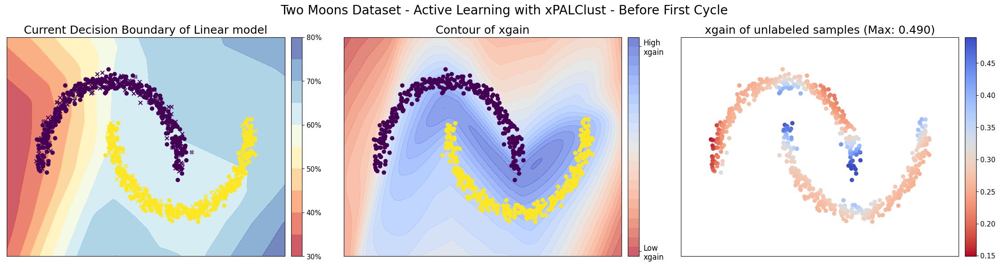

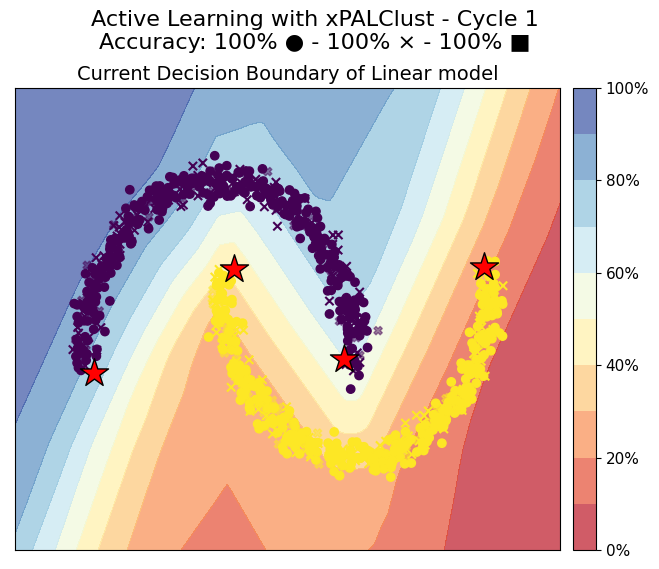

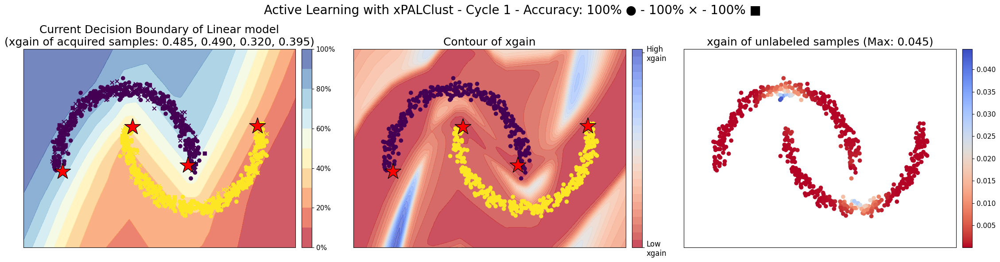

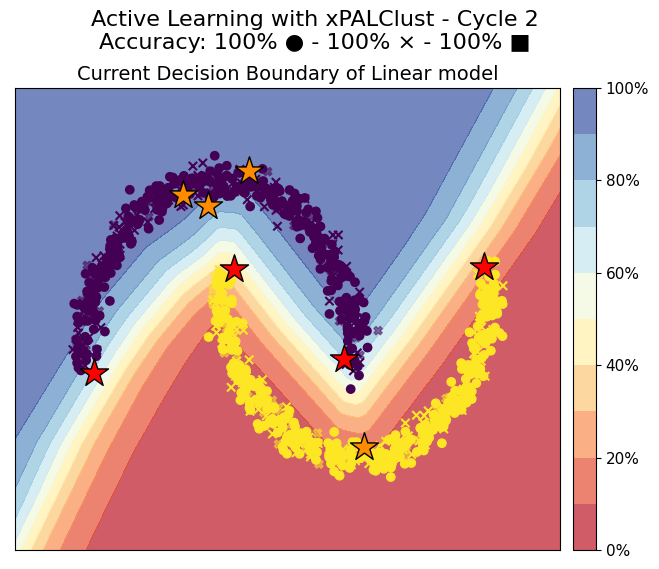

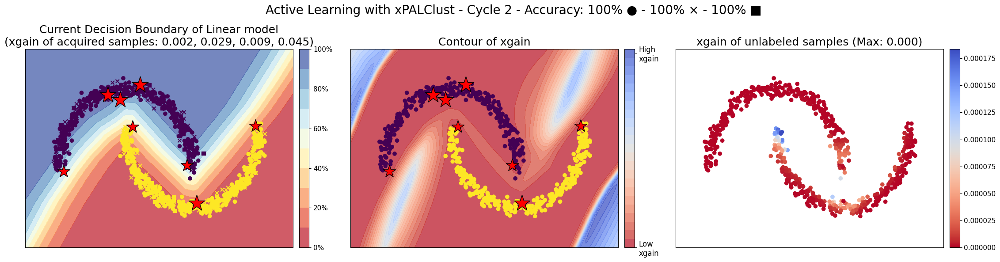

...

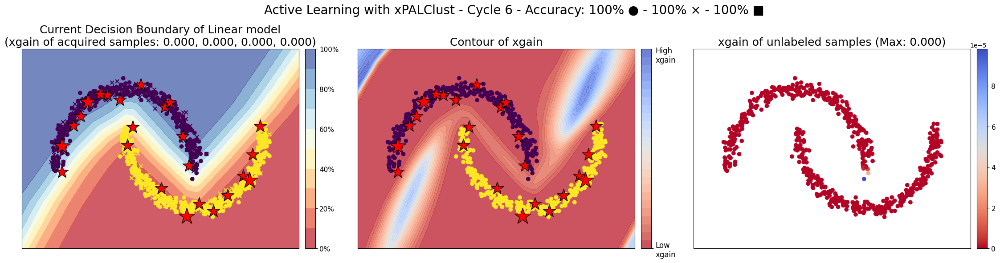

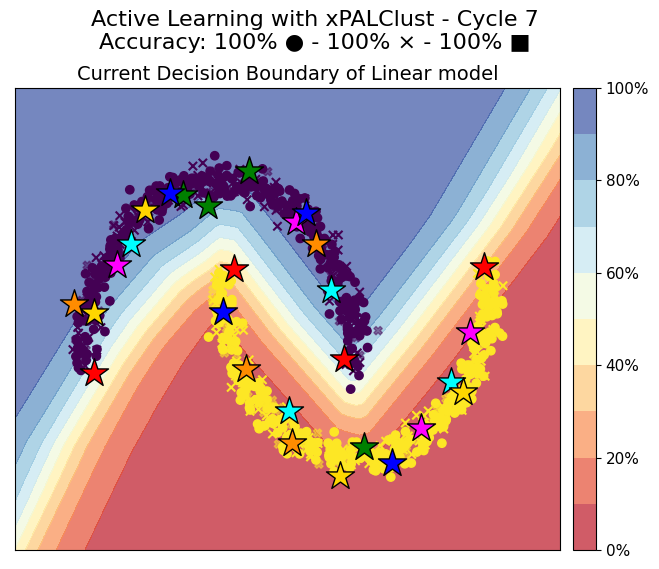

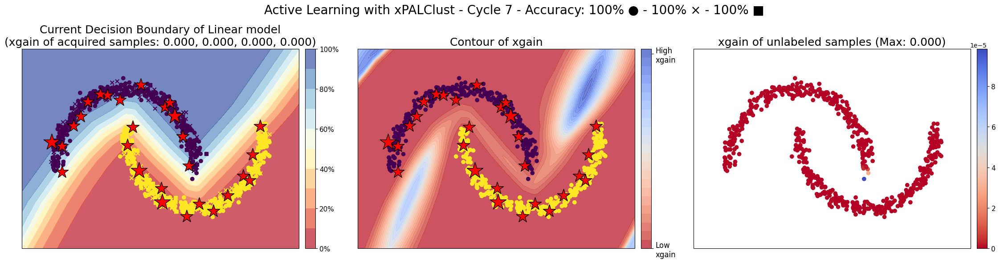

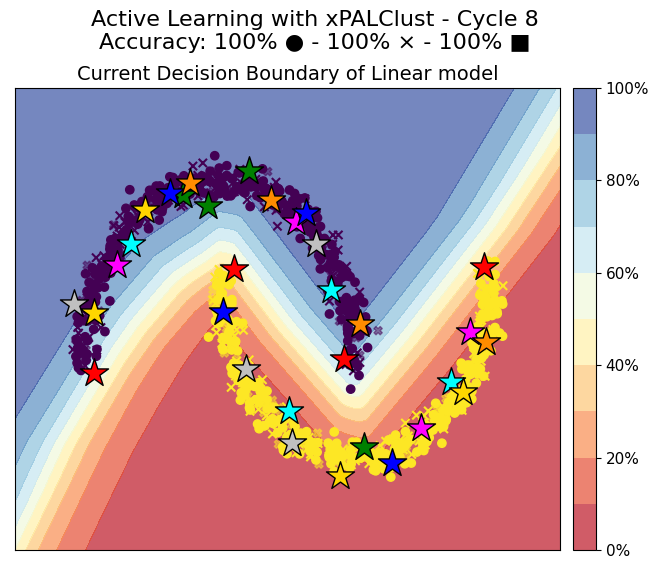

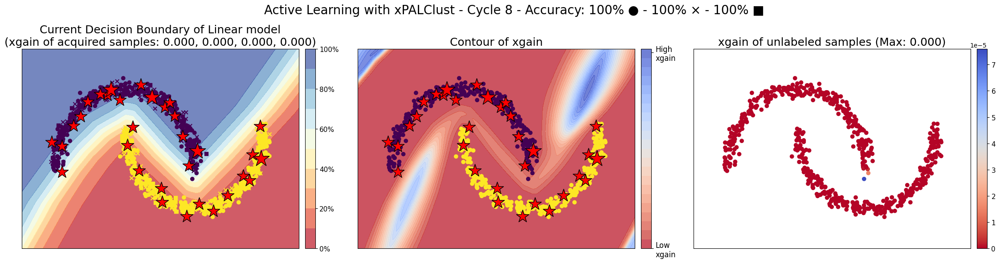

In [25]:
grid_size=150

# # Since I cant get it to be deterministic, I load the features every time
train_features = torch.load("train_features_final_simclr.pth")
train_labels = torch.load("train_labels_final_simclr.pth")
val_features = torch.load("val_features_final_simclr.pth")
val_labels = torch.load("val_labels_final_simclr.pth")
test_features = torch.load( "test_features_final_simclr.pth")
test_labels = torch.load("test_labels_final_simclr.pth")
feature_model = torch.load("feature_model.pth")

grid_features, xx, yy = generate_grid(x_dim=(x_min, x_max), y_dim=(y_min, y_max), grid_size=grid_size, model=feature_model.encoder, standardize=standardize)

trainset = SKLearnDataset(train_features, train_labels)
valset = SKLearnDataset(val_features, val_labels)
testset = SKLearnDataset(test_features, test_labels)

feature_train_dataloader = DataLoader(trainset, batch_size=64, shuffle=False)
feature_val_dataloader = DataLoader(valset, batch_size=512, shuffle=False)
feature_test_dataloader = DataLoader(testset, batch_size=512, shuffle=False)

results = {}
queried_indices = {}

# AL Strategy
gamma = _calculate_mean_gamma(train_features)
S = kernels(X=train_features, Y=train_features, metric="rbf", gamma=gamma)
strategy = "xpalclust"
# Active learning
xpal_init = True
n_init = 0
n_query = 4
n_cylce = 8

if strategy == "xpal":
    al_strategy = xpal.XPAL(num_classes, S, subset_size=None, alpha_c=alpha, alpha_x=alpha, random_seed=seed)
    name = "xPAL"
elif strategy == "xpalclust":
    al_strategy = xpalclust.XPALClust(num_classes, S, subset_size=None, alpha_c=alpha, alpha_x=alpha, random_seed=seed)
    name = "xPALClust"

# AL Model
base_model = LinearModel(encoder_output_dim, num_classes)
optimizer = Adam(params=base_model.parameters(),
                    lr=0.01,
                weight_decay=0.0005)

lr_scheduler = CosineAnnealingLRLinearWarmup(
    optimizer=optimizer,
    num_epochs=40,
    warmup_epochs=10
)

al_model = DeterministicModel(
    base_model, optimizer=optimizer, lr_scheduler=lr_scheduler,
    train_metrics={'train_acc': metrics.Accuracy()},
    val_metrics={'val_acc': metrics.Accuracy()},
)

# Setup AL Module
al_datamodule = ActiveLearningDataModule(
    train_dataset=trainset,
    val_dataset=valset,
    test_dataset=testset,
    train_batch_size=train_batch_size,
    predict_batch_size=512,
    seed=seed
)

labeled_samples, labeled_indices, y_labeled, unlabeled_samples, unlabeled_indices = get_data(al_datamodule)

unlabeled_gains = calculate_gain_from_strategy(al_strategy, labeled_indices, unlabeled_indices, num_classes, alpha)

with torch.no_grad():
    y_pred = softmax(al_model.model(grid_features))
y_pred = y_pred[:, 0].reshape(xx.shape)

data = torch.cat([labeled_samples, grid_features])

mapped_labeled_indices = np.arange(0, len(labeled_samples))
mapped_unlabeled_indices = np.arange(len(labeled_samples), len(labeled_samples) + grid_features.shape[0])

grid_gains = calculate_gain_from_data(data, mapped_labeled_indices, mapped_unlabeled_indices, num_classes, alpha, gamma)
grid_gains = grid_gains.reshape(xx.shape)

indices, top_gains = al_strategy.query(
        model=al_model,
        al_datamodule=al_datamodule,
        acq_size=n_query,
        return_gains=True
    )

max_gain_x_idx , max_gain_y_idx = np.unravel_index(np.argmax(grid_gains), grid_gains.shape)
max_gain_x , max_gain_y = xx[max_gain_x_idx, max_gain_y_idx], yy[max_gain_x_idx, max_gain_y_idx]

fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(22.5, 6))
fig.suptitle(f"Two Moons Dataset - Active Learning with {name} - Before First Cycle", fontsize=20)

ax1, ax2, ax3 = axes[0], axes[1], axes[2]

contour = ax1.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
ax1.set_xlim(xx.min(), xx.max())
ax1.set_ylim(yy.min(), yy.max())

ax1.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
ax1.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
ax1.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="X", alpha=0.5)
ax1.set_title("Current Decision Boundary of Linear model", fontsize=18)
ax1.set_xticks([])
ax1.set_yticks([])
fmt = lambda x, pos: "{:g}%".format(x * 100)
cbar = fig.colorbar(contour, ax=ax1, fraction=0.1, pad=0.02, format=fmt)
cbar.ax.tick_params(labelsize=11)

contour = ax2.contourf(xx, yy, grid_gains, cmap=plt.cm.coolwarm_r, alpha=0.7, levels=25)
# ax2.colorbar(contour)
ax2.set_xlim(xx.min(), xx.max())
ax2.set_ylim(yy.min(), yy.max())

ax2.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
ax2.set_title(f"Contour of xgain", fontsize=18)
cbar = fig.colorbar(contour, ax=ax2, fraction=0.1, pad=0.02)
cbar.set_ticks([grid_gains.min(), grid_gains.max()])
cbar.set_ticklabels(['Low\nxgain', 'High\nxgain'], fontsize=12)

ax3.set_xlim(xx.min(), xx.max())
ax3.set_ylim(yy.min(), yy.max())

sc = ax3.scatter(X_train[unlabeled_indices, 0], X_train[unlabeled_indices, 1], c=unlabeled_gains, marker="o", cmap=plt.cm.coolwarm_r)
unlabeled_gains_max_idx = unlabeled_gains.argmax()
#ax3.scatter(X_train[unlabeled_indices, 0][unlabeled_gains_max_idx], X_train[unlabeled_indices, 1][unlabeled_gains_max_idx], c="black", s=350, marker="x")
ax3.set_title(f"xgain of unlabeled samples (Max: {unlabeled_gains.max():.3f})", fontsize=18)
cbar = fig.colorbar(sc, ax=ax3, fraction=0.1, pad=0.02)
cbar.ax.tick_params(labelsize=11)
fig.tight_layout()
plt.savefig(f"linear_{strategy}_{n_query}_initial_simclr.pdf", bbox_inches='tight')
plt.show()

# Active Learning Cycles
for i_acq in range(0, n_cylce):
    cycle_results = {}

    indices, top_gains = al_strategy.query(
        model=al_model,
        al_datamodule=al_datamodule,
        acq_size=n_query,
        return_gains=True
    )
    al_datamodule.update_annotations(indices)
    queried_indices[f'cycle{i_acq}'] = indices

    #  model cold start
    al_model.reset_states()

    # Train with updated annotations
    trainer = L.Trainer(
        max_epochs=40,
        enable_checkpointing=False,
        accelerator="cpu",
        default_root_dir="Linear_Two_Moons",
        enable_progress_bar=False,
        check_val_every_n_epoch=1,
    )
    trainer.fit(al_model, al_datamodule)

    train_accuracy = calc_accuracy(trainer, al_model, DataLoader(al_datamodule.train_dataset))
    val_accuracy = calc_accuracy(trainer, al_model, al_datamodule.val_dataloader())
    test_accuracy = calc_accuracy(trainer, al_model, al_datamodule.test_dataloader())

    ind = queried_indices[f'cycle{i_acq}']
    queried_sample_cycle = X_train[ind]

    queried_samples = X_train[[item for sublist in [value for value in queried_indices.values()] for item in sublist]]

    labeled_samples, labeled_indices, y_labeled, unlabeled_samples, unlabeled_indices = get_data(al_datamodule)

    unlabeled_gains = calculate_gain_from_strategy(al_strategy, labeled_indices, unlabeled_indices, num_classes, alpha)

    with torch.no_grad():
        y_pred = softmax(al_model.model(grid_features))
    y_pred = y_pred[:, 0].reshape(xx.shape)

    data = torch.cat([labeled_samples, grid_features])
    mapped_labeled_indices = np.arange(0, len(labeled_samples))
    mapped_unlabeled_indices = np.arange(len(labeled_samples), len(labeled_samples) + grid_features.shape[0])
    grid_gains = calculate_gain_from_data(data, mapped_labeled_indices, mapped_unlabeled_indices, num_classes, alpha, gamma)
    grid_gains = grid_gains.reshape(xx.shape)

    max_gain_x_idx , max_gain_y_idx = np.unravel_index(np.argmax(grid_gains), grid_gains.shape)
    max_gain_x , max_gain_y = xx[max_gain_x_idx, max_gain_y_idx], yy[max_gain_x_idx, max_gain_y_idx]

    db_fig, db_ax = plt.subplots(ncols=1, sharex=True, sharey=True, figsize=(8, 6))
    db_fig.suptitle(f"Active Learning with {name} - Cycle {i_acq + 1}\nAccuracy: {train_accuracy:.0%} ● - {val_accuracy:.0%} × - {test_accuracy:.0%} ■", fontsize=16, y=1.01)
    contour = db_ax.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
    db_ax.set_xlim(xx.min(), xx.max())
    db_ax.set_ylim(yy.min(), yy.max())

    db_ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    db_ax.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
    db_ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="X", alpha=0.5)
    colors = ["red", "green", "cyan", "fuchsia", "blue", "gold", "silver", "white"]
    for i in range(i_acq):
        db_ax.scatter(queried_samples[i * n_query: i * n_query + n_query, 0], queried_samples[i * n_query: i * n_query + n_query, 1], c=colors[i], marker='*', s=450, edgecolors='black')
    if i_acq == 0:
        db_ax.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=450, edgecolors='black')
    else:
        db_ax.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="darkorange", marker='*', s=450, edgecolors='black')
    db_ax.set_title("Current Decision Boundary of Linear model", fontsize=14)
    db_ax.set_xticks([])
    db_ax.set_yticks([])
    cbar = db_fig.colorbar(contour, ax=db_ax, fraction=0.1, pad=0.02, format=fmt)
    cbar.ax.tick_params(labelsize=11)
    plt.savefig(f"linear_decision_boundary_{strategy}_{n_query}_cycle_{i_acq + 1}_simclr.pdf", bbox_inches='tight')
    plt.show()

    fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(22.5, 6))
    fig.suptitle(f"Active Learning with {name} - Cycle {i_acq + 1} - Accuracy: {train_accuracy:.0%} ● - {val_accuracy:.0%} × - {test_accuracy:.0%} ■", fontsize=20)

    ax1, ax2, ax3 = axes[0], axes[1], axes[2]

    contour = ax1.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
    ax1.set_xlim(xx.min(), xx.max())
    ax1.set_ylim(yy.min(), yy.max())

    ax1.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax1.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
    ax1.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="s")
    ax1.scatter(queried_samples[:, 0], queried_samples[:, 1], c="red", marker='*', s=450, edgecolors='black')
    ax1.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=750, edgecolors='black')
    if not isinstance(top_gains, list):
        top_gains = top_gains.tolist()
    if isinstance(top_gains, list):
        top_gains = [f"{gain:.3f}" for gain in top_gains]
        ax1.set_title(f"Current Decision Boundary of Linear model\n(xgain of acquired samples: {', '.join(top_gains)})", fontsize=18)
    else:
        ax1.set_title(f"Current Decision Boundary of Linear model\n(xgain of acquired samples: {top_gains.item():.3f})", fontsize=18)

    ax1.set_xticks([])
    ax1.set_yticks([])
    cbar = fig.colorbar(contour, ax=ax1, fraction=0.1, pad=0.02, format=fmt)
    cbar.ax.tick_params(labelsize=11)

    contour = ax2.contourf(xx, yy, grid_gains, cmap=plt.cm.coolwarm_r, alpha=0.75, levels=25)
    ax2.set_xlim(xx.min(), xx.max())
    ax2.set_ylim(yy.min(), yy.max())

    ax2.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax2.scatter(queried_samples[:, 0], queried_samples[:, 1], c="red", marker='*', s=450, edgecolors='black')
    ax2.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=750, edgecolors='black')
    ax2.set_title(f"Contour of xgain", fontsize=18)
    cbar = fig.colorbar(contour, ax=ax2, fraction=0.1, pad=0.02)
    cbar.set_ticks([grid_gains.min(), grid_gains.max()])
    cbar.set_ticklabels(['Low\nxgain', 'High\nxgain'], fontsize=12)

    ax3.set_xlim(xx.min(), xx.max())
    ax3.set_ylim(yy.min(), yy.max())

    sc = ax3.scatter(X_train[unlabeled_indices, 0], X_train[unlabeled_indices, 1], c=unlabeled_gains, marker="o", cmap=plt.cm.coolwarm_r)
    unlabeled_gains_max_idx = unlabeled_gains.argmax()
    # ax3.scatter(X_train[unlabeled_indices, 0][unlabeled_gains_max_idx], X_train[unlabeled_indices, 1][unlabeled_gains_max_idx], c="black", s=350, marker="x")
    ax3.set_title(f"xgain of unlabeled samples (Max: {unlabeled_gains.max():.3f})", fontsize=18)
    cbar = fig.colorbar(sc, ax=ax3, fraction=0.1, pad=0.02)
    cbar.ax.tick_params(labelsize=11)

    fig.tight_layout()
    plt.savefig(f"linear_{strategy}_{n_query}_cycle_{i_acq + 1}_simclr.pdf", bbox_inches='tight')
    plt.show()

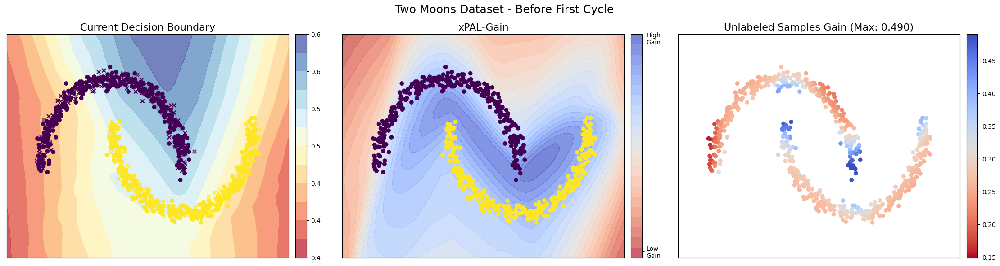

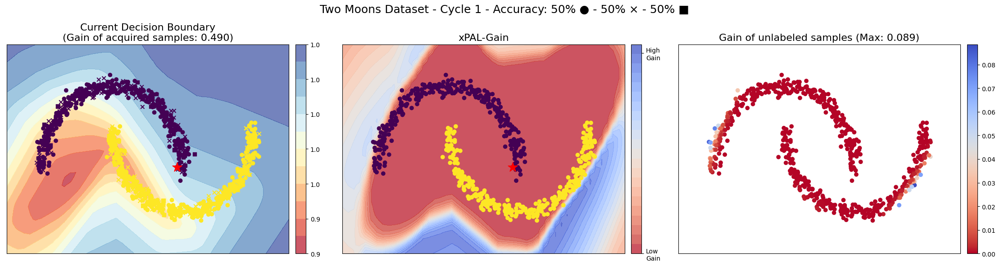

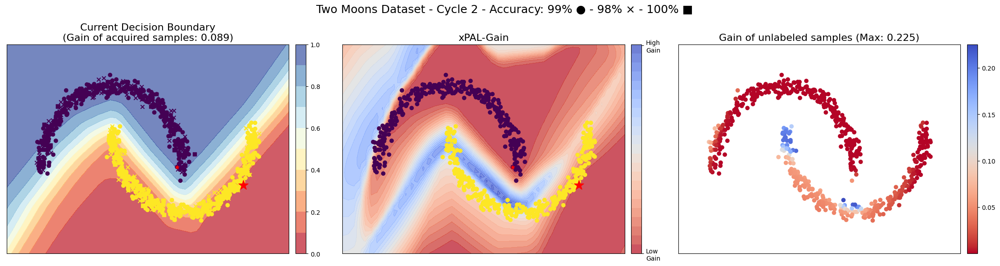

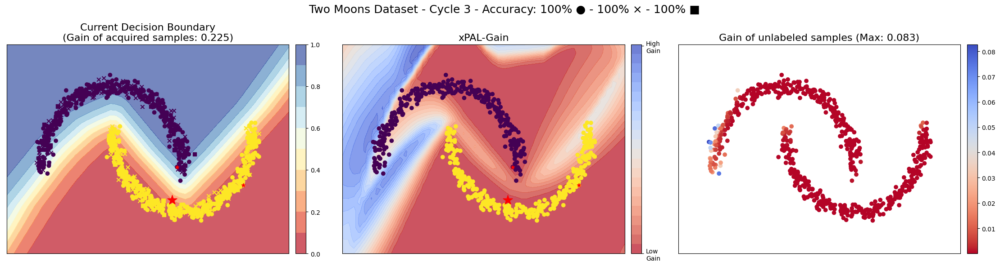

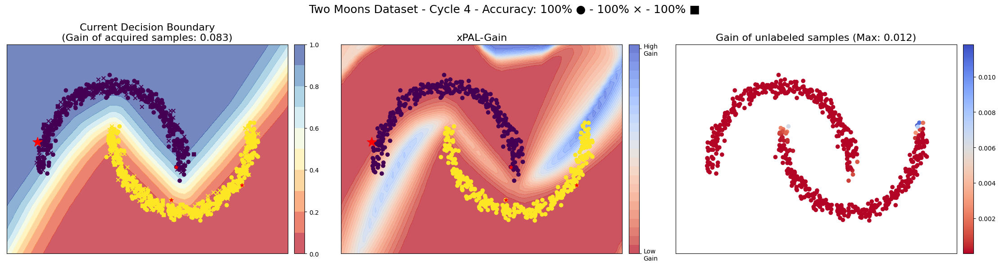

...

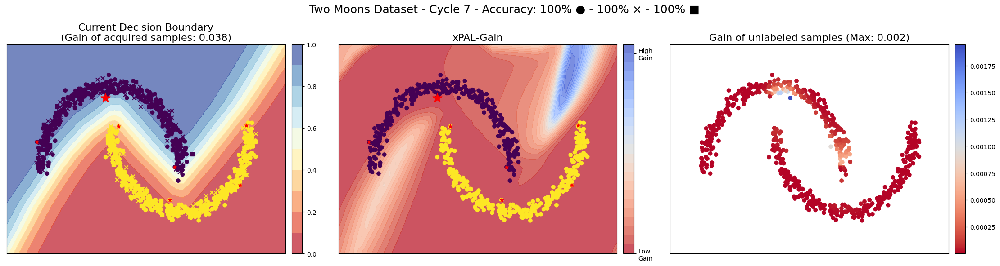

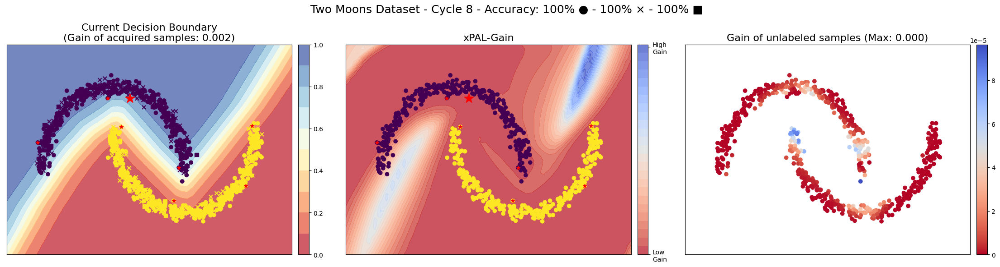

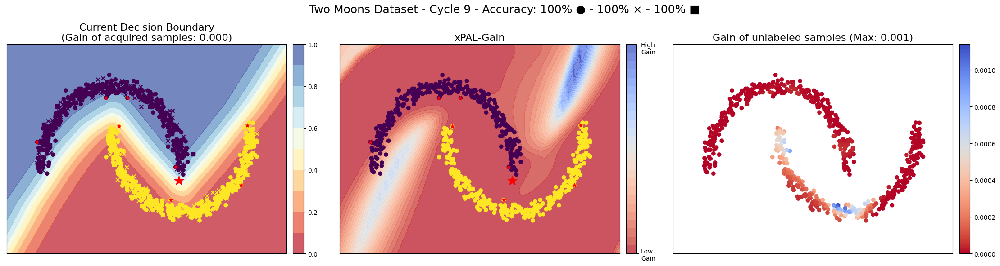

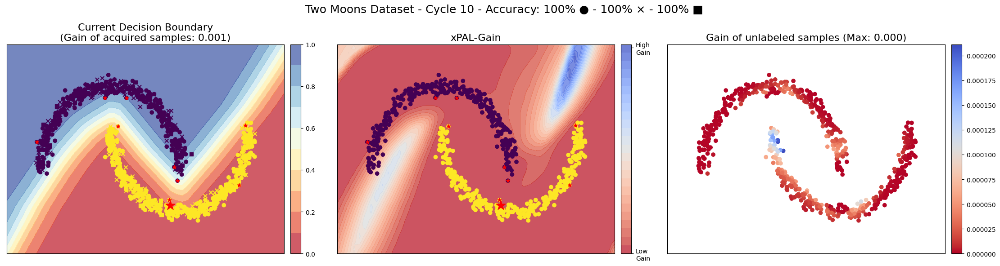

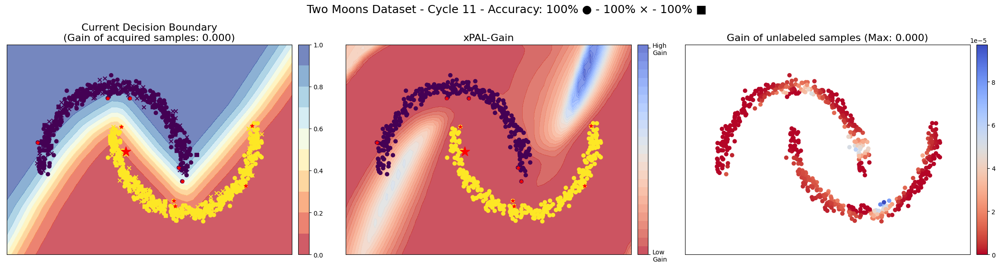

In [15]:
from torch.nn.functional import softmax
from dal_toolbox.models.deterministic.linear import LinearModel

# # Since I cant get it to be deterministic, I load the features every time
train_features = torch.load("train_features_final_simclr.pth")
train_labels = torch.load("train_labels_final_simclr.pth")
val_features = torch.load("val_features_final_simclr.pth")
val_labels = torch.load("val_labels_final_simclr.pth")
test_features = torch.load( "test_features_final_simclr.pth")
test_labels = torch.load("test_labels_final_simclr.pth")
feature_model = torch.load("feature_model.pth")

grid_features, xx, yy = generate_grid(x_dim=(x_min, x_max), y_dim=(y_min, y_max), grid_size=50, model=feature_model.encoder, standardize=standardize)

trainset = SKLearnDataset(train_features, train_labels)
valset = SKLearnDataset(val_features, val_labels)
testset = SKLearnDataset(test_features, test_labels)

feature_train_dataloader = DataLoader(trainset, batch_size=64, shuffle=False)
feature_val_dataloader = DataLoader(valset, batch_size=512, shuffle=False)
feature_test_dataloader = DataLoader(testset, batch_size=512, shuffle=False)

results = {}
queried_indices = {}

# AL Strategy
gamma = _calculate_mean_gamma(train_features)
S = kernels(X=train_features, Y=train_features, metric="rbf", gamma=gamma)
strategy = "xpal"
# Active learning
xpal_init = True
n_init = 0
n_query = 1
n_cylce = 10

if strategy == "xpal":
    al_strategy = xpal.XPAL(num_classes, S, subset_size=None, alpha_c=alpha, alpha_x=alpha, random_seed=seed)
elif strategy == "xpalclust":
    al_strategy = xpalclust.XPALClust(num_classes, S, subset_size=None, alpha_c=alpha, alpha_x=alpha, random_seed=seed)

# AL Model
kernel_params = {"kernel": {"name": "rbf", "gamma": gamma}, "n_neighbors": None}

al_model = LinearModel(32, num_classes)
optimizer = Adam(params=al_model.parameters(),
                    lr=0.01,
                weight_decay=0.0005)

lr_scheduler = CosineAnnealingLRLinearWarmup(
    optimizer=optimizer,
    num_epochs=40,
    warmup_epochs=10
)

al_model = DeterministicModel(
    al_model, optimizer=optimizer, lr_scheduler=lr_scheduler,
    train_metrics={'train_acc': metrics.Accuracy()},
    val_metrics={'val_acc': metrics.Accuracy()},
)

# Setup AL Module
al_datamodule = ActiveLearningDataModule(
    train_dataset=trainset,
    val_dataset=valset,
    test_dataset=testset,
    train_batch_size=train_batch_size,
    predict_batch_size=512,
    seed=seed
)


labeled_samples, labeled_indices, y_labeled, unlabeled_samples, unlabeled_indices = get_data(al_datamodule)

unlabeled_gains = calculate_gain_from_strategy(al_strategy, labeled_indices, unlabeled_indices, num_classes, alpha)

with torch.no_grad():
    y_pred = softmax(al_model.model(grid_features))
y_pred = y_pred[:, 0].reshape(xx.shape)

data = torch.cat([labeled_samples, grid_features])

mapped_labeled_indices = np.arange(0, len(labeled_samples))
mapped_unlabeled_indices = np.arange(len(labeled_samples), len(labeled_samples) + grid_features.shape[0])

grid_gains = calculate_gain_from_data(data, mapped_labeled_indices, mapped_unlabeled_indices, num_classes, alpha, gamma)
grid_gains = grid_gains.reshape(xx.shape)

indices, top_gains = al_strategy.query(
        model=al_model,
        al_datamodule=al_datamodule,
        acq_size=n_query,
        return_gains=True
    )

max_gain_x_idx , max_gain_y_idx = np.unravel_index(np.argmax(grid_gains), grid_gains.shape)
max_gain_x , max_gain_y = xx[max_gain_x_idx, max_gain_y_idx], yy[max_gain_x_idx, max_gain_y_idx]

fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(22.5, 6))
fig.suptitle(f"Two Moons Dataset - Before First Cycle", fontsize=18)

ax1, ax2, ax3 = axes[0], axes[1], axes[2]

contour = ax1.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
ax1.set_xlim(xx.min(), xx.max())
ax1.set_ylim(yy.min(), yy.max())

ax1.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
ax1.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
ax1.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="X", alpha=0.5)
ax1.set_title("Current Decision Boundary", fontsize=16)
ax1.set_xticks([])
ax1.set_yticks([])
fig.colorbar(contour, ax=ax1, fraction=0.1, pad=0.02, format="%.1f")

contour = ax2.contourf(xx, yy, grid_gains, cmap=plt.cm.coolwarm_r, alpha=0.7, levels=25)
# ax2.colorbar(contour)
ax2.set_xlim(xx.min(), xx.max())
ax2.set_ylim(yy.min(), yy.max())

ax2.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
ax2.set_title(f"xPAL-Gain", fontsize=16)
cbar = fig.colorbar(contour, ax=ax2, fraction=0.1, pad=0.02)
cbar.set_ticks([grid_gains.min(), grid_gains.max()])
cbar.set_ticklabels(['Low\nGain', 'High\nGain'])

ax3.set_xlim(xx.min(), xx.max())
ax3.set_ylim(yy.min(), yy.max())

sc = ax3.scatter(X_train[unlabeled_indices, 0], X_train[unlabeled_indices, 1], c=unlabeled_gains, marker="o", cmap=plt.cm.coolwarm_r)
unlabeled_gains_max_idx = unlabeled_gains.argmax()
#ax3.scatter(X_train[unlabeled_indices, 0][unlabeled_gains_max_idx], X_train[unlabeled_indices, 1][unlabeled_gains_max_idx], c="black", s=350, marker="x")
ax3.set_title(f"Unlabeled Samples Gain (Max: {unlabeled_gains.max():.3f})", fontsize=16)
fig.colorbar(sc, ax=ax3, fraction=0.1, pad=0.02)
fig.tight_layout()
#plt.savefig(f"{strategy}_{n_query}_initial_simclr.pdf", bbox_inches='tight')
plt.show()


# Active Learning Cycles
for i_acq in range(0, n_cylce + 1):
    cycle_results = {}

    indices, top_gains = al_strategy.query(
        model=al_model,
        al_datamodule=al_datamodule,
        acq_size=n_query,
        return_gains=True
    )
    al_datamodule.update_annotations(indices)
    queried_indices[f'cycle{i_acq}'] = indices

    #  model cold start
    al_model.reset_states()

    # Train with updated annotations
    trainer = L.Trainer(
        max_epochs=40,
        enable_checkpointing=False,
        accelerator="cpu",
        default_root_dir="Linear_Two_Moons",
        enable_progress_bar=False,
        check_val_every_n_epoch=1,
    )
    trainer.fit(al_model, al_datamodule)

    train_accuracy = calc_accuracy(trainer, al_model, DataLoader(al_datamodule.train_dataset))
    val_accuracy = calc_accuracy(trainer, al_model, al_datamodule.val_dataloader())
    test_accuracy = calc_accuracy(trainer, al_model, al_datamodule.test_dataloader())

    ind = queried_indices[f'cycle{i_acq}']
    queried_sample_cycle = X_train[ind]

    queried_samples = X_train[[item for sublist in [value for value in queried_indices.values()] for item in sublist]]

    labeled_samples, labeled_indices, y_labeled, unlabeled_samples, unlabeled_indices = get_data(al_datamodule)

    unlabeled_gains = calculate_gain_from_strategy(al_strategy, labeled_indices, unlabeled_indices, num_classes, alpha)

    with torch.no_grad():
        y_pred = softmax(al_model.model(grid_features))
    y_pred = y_pred[:, 0].reshape(xx.shape)

    data = torch.cat([labeled_samples, grid_features])
    mapped_labeled_indices = np.arange(0, len(labeled_samples))
    mapped_unlabeled_indices = np.arange(len(labeled_samples), len(labeled_samples) + grid_features.shape[0])
    grid_gains = calculate_gain_from_data(data, mapped_labeled_indices, mapped_unlabeled_indices, num_classes, alpha, gamma)
    grid_gains = grid_gains.reshape(xx.shape)

    max_gain_x_idx , max_gain_y_idx = np.unravel_index(np.argmax(grid_gains), grid_gains.shape)
    max_gain_x , max_gain_y = xx[max_gain_x_idx, max_gain_y_idx], yy[max_gain_x_idx, max_gain_y_idx]

    fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(22.5, 6))
    fig.suptitle(f"Two Moons Dataset - Cycle {i_acq + 1} - Accuracy: {train_accuracy:.0%} ● - {val_accuracy:.0%} × - {test_accuracy:.0%} ■", fontsize=18)

    ax1, ax2, ax3 = axes[0], axes[1], axes[2]

    contour = ax1.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
    ax1.set_xlim(xx.min(), xx.max())
    ax1.set_ylim(yy.min(), yy.max())

    ax1.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax1.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
    ax1.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="s")
    ax1.scatter(queried_samples[:, 0], queried_samples[:, 1], c="red", marker='*')
    ax1.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=250)
    if not isinstance(top_gains, list):
        top_gains = top_gains.tolist()
    if isinstance(top_gains, list):
        top_gains = [f"{gain:.3f}" for gain in top_gains]
        ax1.set_title(f"Current Decision Boundary\n(Gain of acquired samples: {', '.join(top_gains)})", fontsize=16)
    else:
        ax1.set_title(f"Current Decision Boundary\n(Gain of acquired samples: {top_gains.item():.3f})", fontsize=16)

    ax1.set_xticks([])
    ax1.set_yticks([])
    fig.colorbar(contour, ax=ax1, fraction=0.1, pad=0.02, format="%.1f")

    contour = ax2.contourf(xx, yy, grid_gains, cmap=plt.cm.coolwarm_r, alpha=0.75, levels=25)
    ax2.set_xlim(xx.min(), xx.max())
    ax2.set_ylim(yy.min(), yy.max())

    ax2.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax2.scatter(queried_samples[:, 0], queried_samples[:, 1], c="red", marker='*')
    ax2.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=250)
    ax2.set_title(f"xPAL-Gain", fontsize=16)
    cbar = fig.colorbar(contour, ax=ax2, fraction=0.1, pad=0.02)
    cbar.set_ticks([grid_gains.min(), grid_gains.max()])
    cbar.set_ticklabels(['Low\nGain', 'High\nGain'])

    ax3.set_xlim(xx.min(), xx.max())
    ax3.set_ylim(yy.min(), yy.max())

    sc = ax3.scatter(X_train[unlabeled_indices, 0], X_train[unlabeled_indices, 1], c=unlabeled_gains, marker="o", cmap=plt.cm.coolwarm_r)
    unlabeled_gains_max_idx = unlabeled_gains.argmax()
    # ax3.scatter(X_train[unlabeled_indices, 0][unlabeled_gains_max_idx], X_train[unlabeled_indices, 1][unlabeled_gains_max_idx], c="black", s=350, marker="x")
    ax3.set_title(f"Gain of unlabeled samples (Max: {unlabeled_gains.max():.3f})", fontsize=16)
    fig.colorbar(sc, ax=ax3, fraction=0.1, pad=0.02)

    fig.tight_layout()
    #plt.savefig(f"{strategy}_{n_query}_cycle_{i_acq}_simclr.pdf", bbox_inches='tight')
    plt.show()

# XPAL without representations

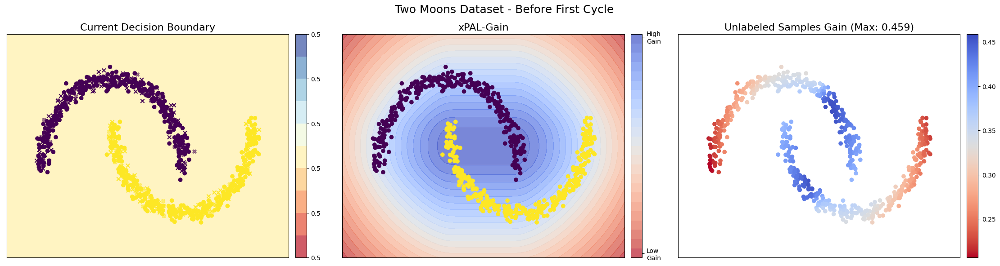

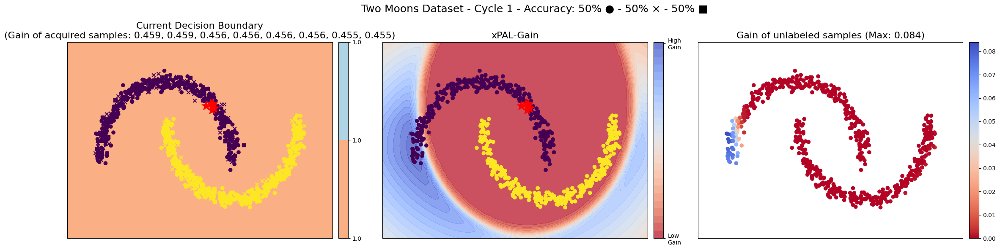

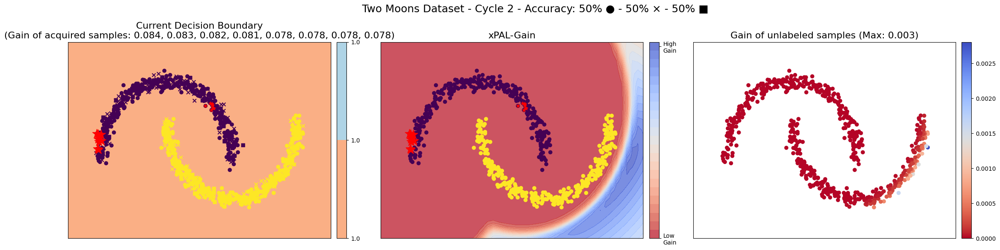

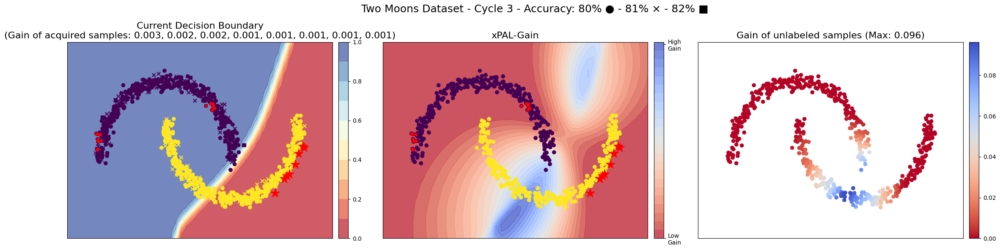

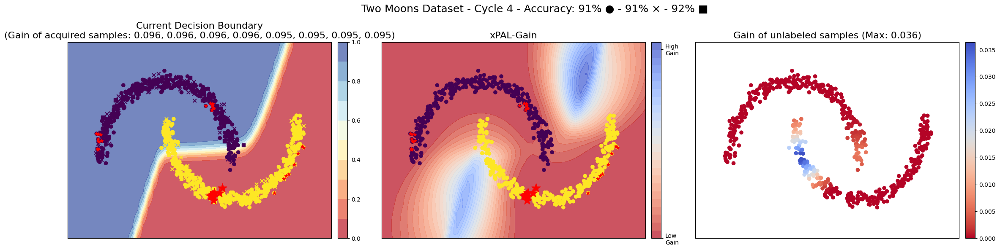

...

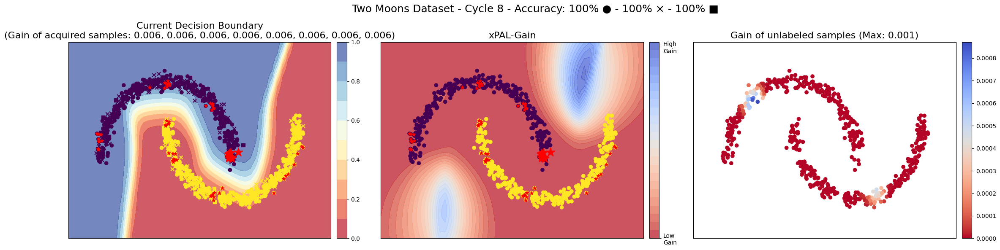

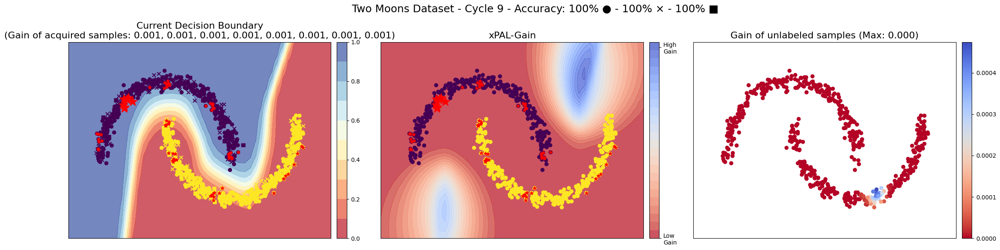

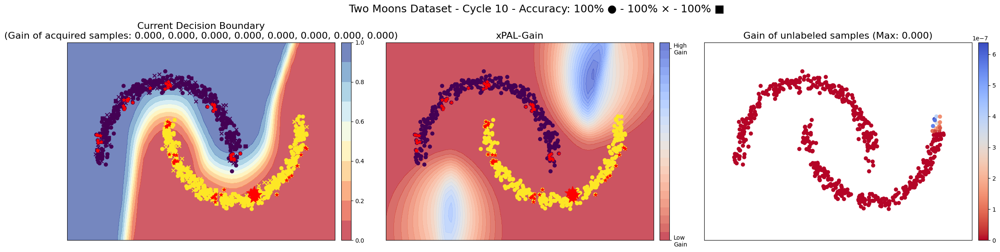

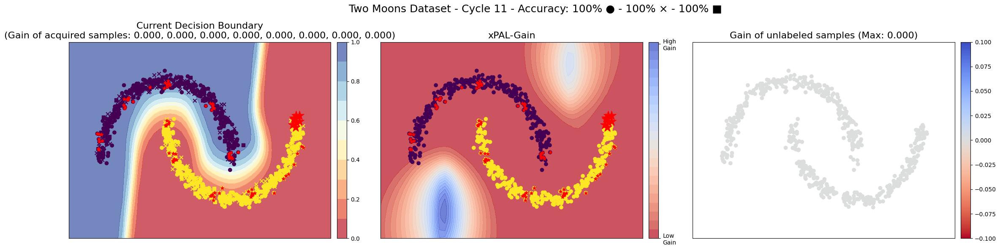

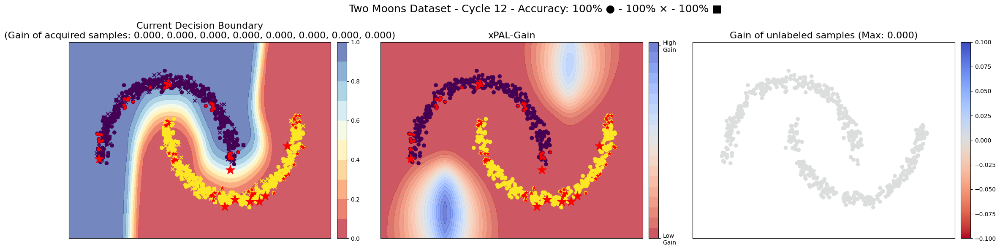

KeyboardInterrupt: 

In [16]:
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 50), np.linspace(y_min, y_max, 50))
grid_features = torch.from_numpy(np.c_[xx.ravel(), yy.ravel()])

trainset = SKLearnDataset(X_train, y_train)
valset = SKLearnDataset(X_val, y_val)
testset = SKLearnDataset(X_test, y_test)

train_dataloader = DataLoader(trainset, batch_size=512, shuffle=False)
val_dataloader = DataLoader(valset, batch_size=512, shuffle=False)
test_dataloader = DataLoader(testset, batch_size=512, shuffle=False)

train_features = torch.from_numpy(X_train)
val_features = torch.from_numpy(X_val)
test_features = torch.from_numpy(X_test)

results = {}
queried_indices = {}

# AL Strategy
gamma = _calculate_mean_gamma(train_features)
S = kernels(X=train_features, Y=train_features, metric="rbf", gamma=gamma)
strategy = "xpal"
# Active learning
xpal_init = True
n_init = 0
n_query = 8
n_cylce = 12

if strategy == "xpal":
    al_strategy = xpal.XPAL(num_classes, S, subset_size=None, alpha_c=alpha, alpha_x=alpha, random_seed=seed)
elif strategy == "xpalclust":
    al_strategy = xpalclust.XPALClust(num_classes, S, subset_size=None, alpha_c=alpha, alpha_x=alpha, random_seed=seed)

# AL Model
kernel_params = {"kernel": {"name": "rbf", "gamma": gamma}, "n_neighbors": None}
al_model = PWCLightning(n_classes=num_classes,
                        random_state=seed,
                        kernel_params=kernel_params,
                        train_metrics={'train_acc': metrics.Accuracy()},
                        val_metrics={'val_acc': metrics.Accuracy()})

# Setup AL Module
al_datamodule = ActiveLearningDataModule(
    train_dataset=trainset,
    val_dataset=valset,
    test_dataset=testset,
    train_batch_size=train_batch_size,
    predict_batch_size=512,
    seed=seed
)


labeled_samples, labeled_indices, y_labeled, unlabeled_samples, unlabeled_indices = get_data(al_datamodule)

unlabeled_gains = calculate_gain_from_strategy(al_strategy, labeled_indices, unlabeled_indices, num_classes, alpha)

y_pred = al_model.model.predict_proba(grid_features)
y_pred = y_pred[:, 0].reshape(xx.shape)

data = torch.cat([labeled_samples, grid_features])

mapped_labeled_indices = np.arange(0, len(labeled_samples))
mapped_unlabeled_indices = np.arange(len(labeled_samples), len(labeled_samples) + grid_features.shape[0])

grid_gains = calculate_gain_from_data(data, mapped_labeled_indices, mapped_unlabeled_indices, num_classes, alpha, gamma)
grid_gains = grid_gains.reshape(xx.shape)

indices, top_gains = al_strategy.query(
        model=al_model,
        al_datamodule=al_datamodule,
        acq_size=n_query,
        return_gains=True
    )

max_gain_x_idx , max_gain_y_idx = np.unravel_index(np.argmax(grid_gains), grid_gains.shape)
max_gain_x , max_gain_y = xx[max_gain_x_idx, max_gain_y_idx], yy[max_gain_x_idx, max_gain_y_idx]

fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(22.5, 6))
fig.suptitle(f"Two Moons Dataset - Before First Cycle", fontsize=18)

ax1, ax2, ax3 = axes[0], axes[1], axes[2]

contour = ax1.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
ax1.set_xlim(xx.min(), xx.max())
ax1.set_ylim(yy.min(), yy.max())

ax1.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
ax1.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
ax1.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="X", alpha=0.5)
ax1.set_title("Current Decision Boundary", fontsize=16)
ax1.set_xticks([])
ax1.set_yticks([])
fig.colorbar(contour, ax=ax1, fraction=0.1, pad=0.02, format="%.1f")

contour = ax2.contourf(xx, yy, grid_gains, cmap=plt.cm.coolwarm_r, alpha=0.7, levels=25)
# ax2.colorbar(contour)
ax2.set_xlim(xx.min(), xx.max())
ax2.set_ylim(yy.min(), yy.max())

ax2.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
ax2.set_title(f"xPAL-Gain", fontsize=16)
cbar = fig.colorbar(contour, ax=ax2, fraction=0.1, pad=0.02)
cbar.set_ticks([grid_gains.min(), grid_gains.max()])
cbar.set_ticklabels(['Low\nGain', 'High\nGain'])

ax3.set_xlim(xx.min(), xx.max())
ax3.set_ylim(yy.min(), yy.max())

sc = ax3.scatter(X_train[unlabeled_indices, 0], X_train[unlabeled_indices, 1], c=unlabeled_gains, marker="o", cmap=plt.cm.coolwarm_r)
unlabeled_gains_max_idx = unlabeled_gains.argmax()
#ax3.scatter(X_train[unlabeled_indices, 0][unlabeled_gains_max_idx], X_train[unlabeled_indices, 1][unlabeled_gains_max_idx], c="black", s=350, marker="x")
ax3.set_title(f"Unlabeled Samples Gain (Max: {unlabeled_gains.max():.3f})", fontsize=16)
fig.colorbar(sc, ax=ax3, fraction=0.1, pad=0.02)
fig.tight_layout()
#plt.savefig(f"{strategy}_{n_query}_initial_simclr.pdf", bbox_inches='tight')
plt.show()


# Active Learning Cycles
for i_acq in range(0, n_cylce + 1):
    cycle_results = {}

    indices, top_gains = al_strategy.query(
        model=al_model,
        al_datamodule=al_datamodule,
        acq_size=n_query,
        return_gains=True
    )
    al_datamodule.update_annotations(indices)
    queried_indices[f'cycle{i_acq}'] = indices

    #  model cold start
    al_model.reset_states()

    # Train with updated annotations
    trainer = L.Trainer(
        max_epochs=2,
        enable_checkpointing=False,
        accelerator="cpu",
        default_root_dir="PWC_Two_Moons",
        enable_progress_bar=False,
        check_val_every_n_epoch=1,
    )
    trainer.fit(al_model, al_datamodule)

    train_accuracy = calc_accuracy(trainer, al_model, DataLoader(al_datamodule.train_dataset))
    val_accuracy = calc_accuracy(trainer, al_model, al_datamodule.val_dataloader())
    test_accuracy = calc_accuracy(trainer, al_model, al_datamodule.test_dataloader())

    ind = queried_indices[f'cycle{i_acq}']
    queried_sample_cycle = X_train[ind]

    queried_samples = X_train[[item for sublist in [value for value in queried_indices.values()] for item in sublist]]

    labeled_samples, labeled_indices, y_labeled, unlabeled_samples, unlabeled_indices = get_data(al_datamodule)

    unlabeled_gains = calculate_gain_from_strategy(al_strategy, labeled_indices, unlabeled_indices, num_classes, alpha)

    y_pred = al_model.model.predict_proba(grid_features)
    y_pred = y_pred[:, 0].reshape(xx.shape)

    data = torch.cat([labeled_samples, grid_features])
    mapped_labeled_indices = np.arange(0, len(labeled_samples))
    mapped_unlabeled_indices = np.arange(len(labeled_samples), len(labeled_samples) + grid_features.shape[0])
    grid_gains = calculate_gain_from_data(data, mapped_labeled_indices, mapped_unlabeled_indices, num_classes, alpha, gamma)
    grid_gains = grid_gains.reshape(xx.shape)

    max_gain_x_idx , max_gain_y_idx = np.unravel_index(np.argmax(grid_gains), grid_gains.shape)
    max_gain_x , max_gain_y = xx[max_gain_x_idx, max_gain_y_idx], yy[max_gain_x_idx, max_gain_y_idx]

    fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(22.5, 6))
    fig.suptitle(f"Two Moons Dataset - Cycle {i_acq + 1} - Accuracy: {train_accuracy:.0%} ● - {val_accuracy:.0%} × - {test_accuracy:.0%} ■", fontsize=18)

    ax1, ax2, ax3 = axes[0], axes[1], axes[2]

    contour = ax1.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
    ax1.set_xlim(xx.min(), xx.max())
    ax1.set_ylim(yy.min(), yy.max())

    ax1.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax1.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
    ax1.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="s")
    ax1.scatter(queried_samples[:, 0], queried_samples[:, 1], c="red", marker='*')
    ax1.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=250)
    if not isinstance(top_gains, list):
        top_gains = top_gains.tolist()
    if isinstance(top_gains, list):
        top_gains = [f"{gain:.3f}" for gain in top_gains]
        ax1.set_title(f"Current Decision Boundary\n(Gain of acquired samples: {', '.join(top_gains)})", fontsize=16)
    else:
        ax1.set_title(f"Current Decision Boundary\n(Gain of acquired samples: {top_gains.item():.3f})", fontsize=16)

    ax1.set_xticks([])
    ax1.set_yticks([])
    fig.colorbar(contour, ax=ax1, fraction=0.1, pad=0.02, format="%.1f")

    contour = ax2.contourf(xx, yy, grid_gains, cmap=plt.cm.coolwarm_r, alpha=0.75, levels=25)
    ax2.set_xlim(xx.min(), xx.max())
    ax2.set_ylim(yy.min(), yy.max())

    ax2.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax2.scatter(queried_samples[:, 0], queried_samples[:, 1], c="red", marker='*')
    ax2.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=250)
    ax2.set_title(f"xPAL-Gain", fontsize=16)
    cbar = fig.colorbar(contour, ax=ax2, fraction=0.1, pad=0.02)
    cbar.set_ticks([grid_gains.min(), grid_gains.max()])
    cbar.set_ticklabels(['Low\nGain', 'High\nGain'])

    ax3.set_xlim(xx.min(), xx.max())
    ax3.set_ylim(yy.min(), yy.max())

    sc = ax3.scatter(X_train[unlabeled_indices, 0], X_train[unlabeled_indices, 1], c=unlabeled_gains, marker="o", cmap=plt.cm.coolwarm_r)
    unlabeled_gains_max_idx = unlabeled_gains.argmax()
    # ax3.scatter(X_train[unlabeled_indices, 0][unlabeled_gains_max_idx], X_train[unlabeled_indices, 1][unlabeled_gains_max_idx], c="black", s=350, marker="x")
    ax3.set_title(f"Gain of unlabeled samples (Max: {unlabeled_gains.max():.3f})", fontsize=16)
    fig.colorbar(sc, ax=ax3, fraction=0.1, pad=0.02)

    fig.tight_layout()
    #plt.savefig(f"{strategy}_{n_query}_cycle_{i_acq}_simclr.pdf", bbox_inches='tight')
    plt.show()

In [ ]:
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 50), np.linspace(y_min, y_max, 50))
grid_features = torch.Tensor(np.c_[xx.ravel(), yy.ravel()])

trainset = SKLearnDataset(X_train, y_train)
valset = SKLearnDataset(X_val, y_val)
testset = SKLearnDataset(X_test, y_test)

train_dataloader = DataLoader(trainset, batch_size=512, shuffle=False)
val_dataloader = DataLoader(valset, batch_size=512, shuffle=False)
test_dataloader = DataLoader(testset, batch_size=512, shuffle=False)

train_features = torch.Tensor(X_train)
val_features = torch.Tensor(X_val)
test_features = torch.Tensor(X_test)

results = {}
queried_indices = {}

# AL Strategy
gamma = _calculate_mean_gamma(train_features)
S = kernels(X=train_features, Y=train_features, metric="rbf", gamma=gamma)
strategy = "xpal"
# Active learning
xpal_init = True
n_init = 0
n_query = 1
n_cylce = 10

if strategy == "xpal":
    al_strategy = xpal.XPAL(num_classes, S, subset_size=None, alpha_c=alpha, alpha_x=alpha, random_seed=seed)
elif strategy == "xpalclust":
    al_strategy = xpalclust.XPALClust(num_classes, S, subset_size=None, alpha_c=alpha, alpha_x=alpha, random_seed=seed)

# AL Model
kernel_params = {"kernel": {"name": "rbf", "gamma": gamma}, "n_neighbors": None}
al_model = LinearModel(2, num_classes)
optimizer = Adam(params=al_model.parameters(),
                    lr=0.01,
                weight_decay=0.0005)

lr_scheduler = CosineAnnealingLRLinearWarmup(
    optimizer=optimizer,
    num_epochs=60,
    warmup_epochs=10
)

al_model = DeterministicModel(
    al_model, optimizer=optimizer, lr_scheduler=lr_scheduler,
    train_metrics={'train_acc': metrics.Accuracy()},
    val_metrics={'val_acc': metrics.Accuracy()},
)

# Setup AL Module
al_datamodule = ActiveLearningDataModule(
    train_dataset=trainset,
    val_dataset=valset,
    test_dataset=testset,
    train_batch_size=train_batch_size,
    predict_batch_size=512,
    seed=seed
)


labeled_samples, labeled_indices, y_labeled, unlabeled_samples, unlabeled_indices = get_data(al_datamodule)

unlabeled_gains = calculate_gain_from_strategy(al_strategy, labeled_indices, unlabeled_indices, num_classes, alpha)

with torch.no_grad():
    y_pred = softmax(al_model.model(grid_features))
y_pred = y_pred[:, 0].reshape(xx.shape)

data = torch.cat([labeled_samples, grid_features])

mapped_labeled_indices = np.arange(0, len(labeled_samples))
mapped_unlabeled_indices = np.arange(len(labeled_samples), len(labeled_samples) + grid_features.shape[0])

grid_gains = calculate_gain_from_data(data, mapped_labeled_indices, mapped_unlabeled_indices, num_classes, alpha, gamma)
grid_gains = grid_gains.reshape(xx.shape)

indices, top_gains = al_strategy.query(
        model=al_model,
        al_datamodule=al_datamodule,
        acq_size=n_query,
        return_gains=True
    )

max_gain_x_idx , max_gain_y_idx = np.unravel_index(np.argmax(grid_gains), grid_gains.shape)
max_gain_x , max_gain_y = xx[max_gain_x_idx, max_gain_y_idx], yy[max_gain_x_idx, max_gain_y_idx]

fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(22.5, 6))
fig.suptitle(f"Two Moons Dataset - Before First Cycle", fontsize=18)

ax1, ax2, ax3 = axes[0], axes[1], axes[2]

contour = ax1.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
ax1.set_xlim(xx.min(), xx.max())
ax1.set_ylim(yy.min(), yy.max())

ax1.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
ax1.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
ax1.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="X", alpha=0.5)
ax1.set_title("Current Decision Boundary", fontsize=16)
ax1.set_xticks([])
ax1.set_yticks([])
fig.colorbar(contour, ax=ax1, fraction=0.1, pad=0.02, format="%.1f")

contour = ax2.contourf(xx, yy, grid_gains, cmap=plt.cm.coolwarm_r, alpha=0.7, levels=25)
# ax2.colorbar(contour)
ax2.set_xlim(xx.min(), xx.max())
ax2.set_ylim(yy.min(), yy.max())

ax2.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
ax2.set_title(f"xPAL-Gain", fontsize=16)
cbar = fig.colorbar(contour, ax=ax2, fraction=0.1, pad=0.02)
cbar.set_ticks([grid_gains.min(), grid_gains.max()])
cbar.set_ticklabels(['Low\nGain', 'High\nGain'])

ax3.set_xlim(xx.min(), xx.max())
ax3.set_ylim(yy.min(), yy.max())

sc = ax3.scatter(X_train[unlabeled_indices, 0], X_train[unlabeled_indices, 1], c=unlabeled_gains, marker="o", cmap=plt.cm.coolwarm_r)
unlabeled_gains_max_idx = unlabeled_gains.argmax()
#ax3.scatter(X_train[unlabeled_indices, 0][unlabeled_gains_max_idx], X_train[unlabeled_indices, 1][unlabeled_gains_max_idx], c="black", s=350, marker="x")
ax3.set_title(f"Unlabeled Samples Gain (Max: {unlabeled_gains.max():.3f})", fontsize=16)
fig.colorbar(sc, ax=ax3, fraction=0.1, pad=0.02)
fig.tight_layout()
#plt.savefig(f"{strategy}_{n_query}_initial_simclr.pdf", bbox_inches='tight')
plt.show()


# Active Learning Cycles
for i_acq in range(0, n_cylce + 1):
    cycle_results = {}

    indices, top_gains = al_strategy.query(
        model=al_model,
        al_datamodule=al_datamodule,
        acq_size=n_query,
        return_gains=True
    )
    al_datamodule.update_annotations(indices)
    queried_indices[f'cycle{i_acq}'] = indices

    #  model cold start
    al_model.reset_states()

    # Train with updated annotations
    trainer = L.Trainer(
        max_epochs=60,
        enable_checkpointing=False,
        accelerator="cpu",
        default_root_dir="PWC_Two_Moons",
        enable_progress_bar=False,
        check_val_every_n_epoch=1,
    )
    trainer.fit(al_model, al_datamodule)

    train_accuracy = calc_accuracy(trainer, al_model, DataLoader(al_datamodule.train_dataset))
    val_accuracy = calc_accuracy(trainer, al_model, al_datamodule.val_dataloader())
    test_accuracy = calc_accuracy(trainer, al_model, al_datamodule.test_dataloader())

    ind = queried_indices[f'cycle{i_acq}']
    queried_sample_cycle = X_train[ind]

    queried_samples = X_train[[item for sublist in [value for value in queried_indices.values()] for item in sublist]]

    labeled_samples, labeled_indices, y_labeled, unlabeled_samples, unlabeled_indices = get_data(al_datamodule)

    unlabeled_gains = calculate_gain_from_strategy(al_strategy, labeled_indices, unlabeled_indices, num_classes, alpha)

    with torch.no_grad():
        y_pred = softmax(al_model.model(grid_features))
    y_pred = y_pred[:, 0].reshape(xx.shape)

    data = torch.cat([labeled_samples, grid_features])
    mapped_labeled_indices = np.arange(0, len(labeled_samples))
    mapped_unlabeled_indices = np.arange(len(labeled_samples), len(labeled_samples) + grid_features.shape[0])
    grid_gains = calculate_gain_from_data(data, mapped_labeled_indices, mapped_unlabeled_indices, num_classes, alpha, gamma)
    grid_gains = grid_gains.reshape(xx.shape)

    max_gain_x_idx , max_gain_y_idx = np.unravel_index(np.argmax(grid_gains), grid_gains.shape)
    max_gain_x , max_gain_y = xx[max_gain_x_idx, max_gain_y_idx], yy[max_gain_x_idx, max_gain_y_idx]

    fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(22.5, 6))
    fig.suptitle(f"Two Moons Dataset - Cycle {i_acq + 1} - Accuracy: {train_accuracy:.0%} ● - {val_accuracy:.0%} × - {test_accuracy:.0%} ■", fontsize=18)

    ax1, ax2, ax3 = axes[0], axes[1], axes[2]

    contour = ax1.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7, levels=10)
    ax1.set_xlim(xx.min(), xx.max())
    ax1.set_ylim(yy.min(), yy.max())

    ax1.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax1.scatter(X_val[:, 0], X_val[:, 1], c=y_val, marker="x")
    ax1.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker="s")
    ax1.scatter(queried_samples[:, 0], queried_samples[:, 1], c="red", marker='*')
    ax1.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=250)
    if not isinstance(top_gains, list):
        top_gains = top_gains.tolist()
    if isinstance(top_gains, list):
        top_gains = [f"{gain:.3f}" for gain in top_gains]
        ax1.set_title(f"Current Decision Boundary\n(Gain of acquired samples: {', '.join(top_gains)})", fontsize=16)
    else:
        ax1.set_title(f"Current Decision Boundary\n(Gain of acquired samples: {top_gains.item():.3f})", fontsize=16)

    ax1.set_xticks([])
    ax1.set_yticks([])
    fig.colorbar(contour, ax=ax1, fraction=0.1, pad=0.02, format="%.1f")

    contour = ax2.contourf(xx, yy, grid_gains, cmap=plt.cm.coolwarm_r, alpha=0.75, levels=25)
    ax2.set_xlim(xx.min(), xx.max())
    ax2.set_ylim(yy.min(), yy.max())

    ax2.scatter(X_train[:, 0], X_train[:, 1], c=y_train, marker="o")
    ax2.scatter(queried_samples[:, 0], queried_samples[:, 1], c="red", marker='*')
    ax2.scatter(queried_sample_cycle[:, 0], queried_sample_cycle[:, 1], c="red", marker='*', s=250)
    ax2.set_title(f"xPAL-Gain", fontsize=16)
    cbar = fig.colorbar(contour, ax=ax2, fraction=0.1, pad=0.02)
    cbar.set_ticks([grid_gains.min(), grid_gains.max()])
    cbar.set_ticklabels(['Low\nGain', 'High\nGain'])

    ax3.set_xlim(xx.min(), xx.max())
    ax3.set_ylim(yy.min(), yy.max())

    sc = ax3.scatter(X_train[unlabeled_indices, 0], X_train[unlabeled_indices, 1], c=unlabeled_gains, marker="o", cmap=plt.cm.coolwarm_r)
    unlabeled_gains_max_idx = unlabeled_gains.argmax()
    # ax3.scatter(X_train[unlabeled_indices, 0][unlabeled_gains_max_idx], X_train[unlabeled_indices, 1][unlabeled_gains_max_idx], c="black", s=350, marker="x")
    ax3.set_title(f"Gain of unlabeled samples (Max: {unlabeled_gains.max():.3f})", fontsize=16)
    fig.colorbar(sc, ax=ax3, fraction=0.1, pad=0.02)

    fig.tight_layout()
    #plt.savefig(f"{strategy}_{n_query}_cycle_{i_acq}_simclr.pdf", bbox_inches='tight')
    plt.show()